<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Mon Mar  4 14:31:41 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   50C    P0              88W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 8s, sys: 11 ms, total: 9min 8s
Wall time: 9min 10s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

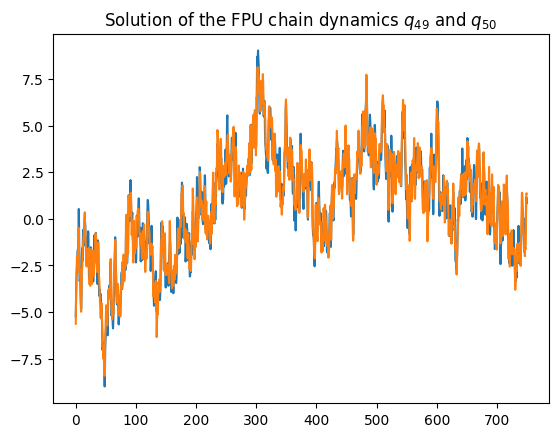

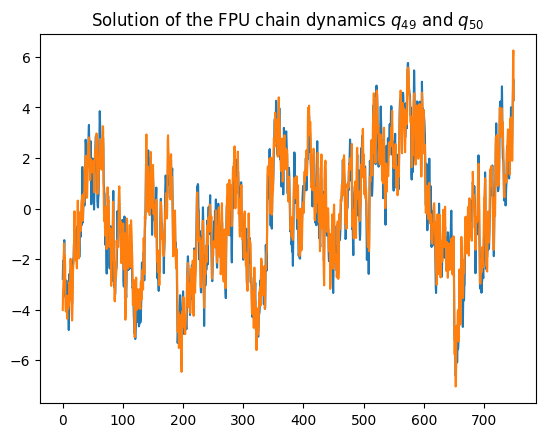

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


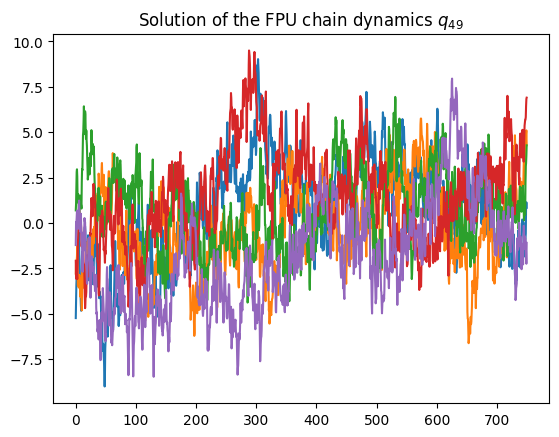

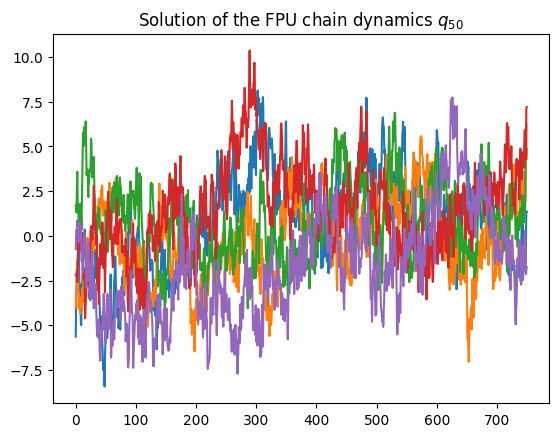

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


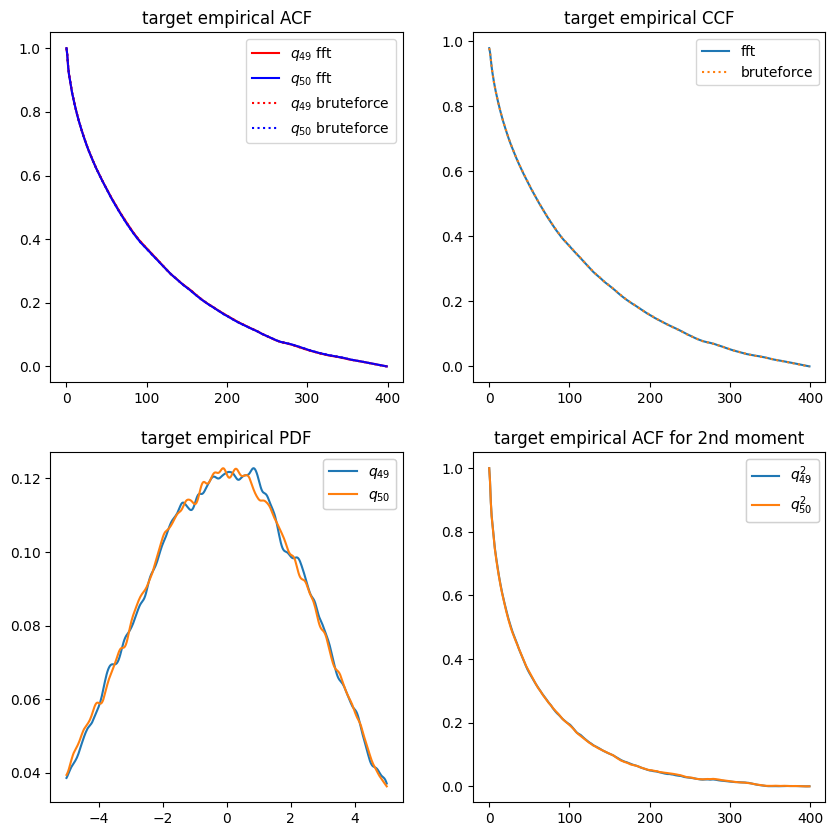

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(x_grid,loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

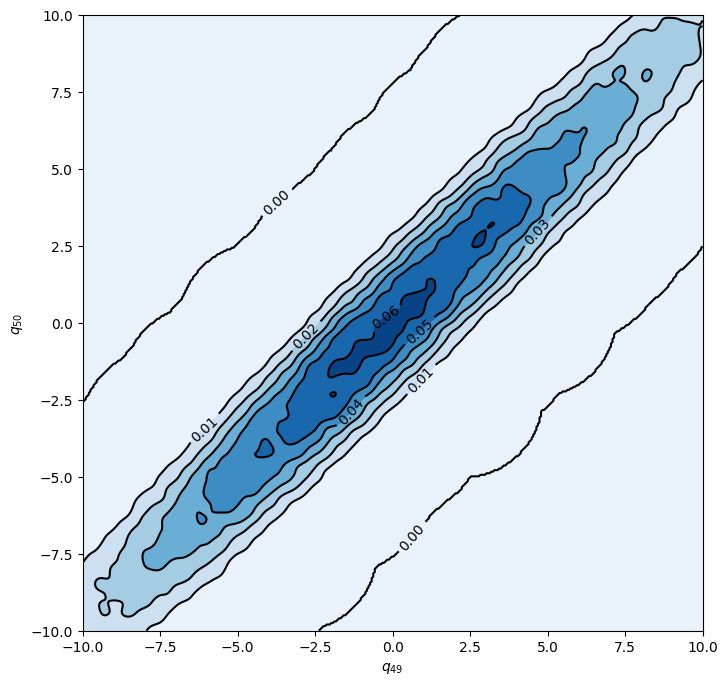

In [14]:
xmin, xmax = -10, 10
ymin, ymax = -10, 10

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

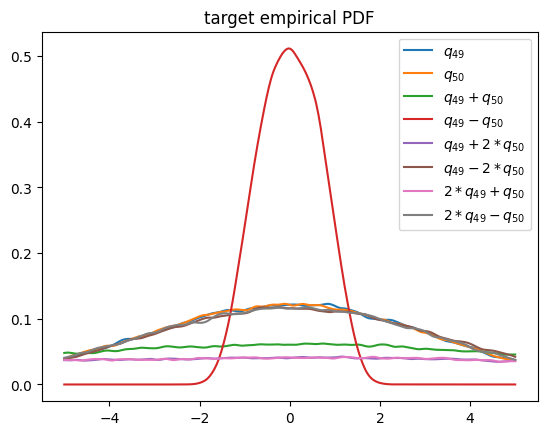

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
# x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [31]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)

        # Rectifying ADAM optimizer
        optimizer_adam = optim.RAdam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.RAdam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)
        # Use cosine annealing for learning rate.
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_adam, 20000)
        scheduler_weight = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_adam_weight, 20000)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            scheduler.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            scheduler_weight.step()
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(1.5).float()
        self.x_pdf2_s = torch.tensor(1.5).float()
        self.x_acf2_s = torch.tensor(1.5).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [32]:
### Defining SINN model
net = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [33]:
model = Model(net=net)

In [34]:
model_type = 1

In [35]:
model.train()

[0]-th step loss: 0.8283, 0.8311, acf: 0.10166, ccf: 0.10165, pdf: 0.29323, pdf2: 0.28985, acf2: 0.04469
[50]-th step loss: 0.7990, 0.7962, acf: 0.08931, ccf: 0.08907, pdf: 0.29324, pdf2: 0.28990, acf2: 0.03471
[100]-th step loss: 0.7162, 0.7172, acf: 0.05963, ccf: 0.05948, pdf: 0.29284, pdf2: 0.28836, acf2: 0.01687
[150]-th step loss: 0.1130, 0.1183, acf: 0.02157, ccf: 0.02155, pdf: 0.04575, pdf2: 0.02521, acf2: 0.00426
[200]-th step loss: 0.0443, 0.0443, acf: 0.00376, ccf: 0.00378, pdf: 0.02080, pdf2: 0.01239, acf2: 0.00352
[250]-th step loss: 0.0277, 0.0282, acf: 0.00116, ccf: 0.00118, pdf: 0.01287, pdf2: 0.00841, acf2: 0.00456
[300]-th step loss: 0.0246, 0.0252, acf: 0.00091, ccf: 0.00093, pdf: 0.01295, pdf2: 0.00886, acf2: 0.00157
[350]-th step loss: 0.0386, 0.0381, acf: 0.00833, ccf: 0.00831, pdf: 0.00873, pdf2: 0.00753, acf2: 0.00520
[400]-th step loss: 0.0180, 0.0172, acf: 0.00074, ccf: 0.00074, pdf: 0.00713, pdf2: 0.00676, acf2: 0.00184
[450]-th step loss: 0.5541, 0.5203, acf:

In [36]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [37]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [38]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [39]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

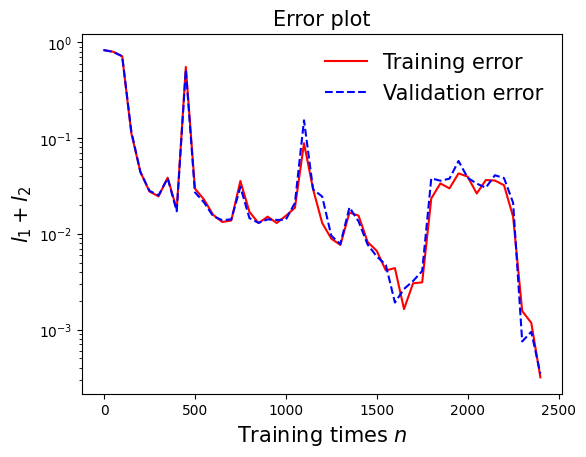

In [40]:
draw_loss(model)

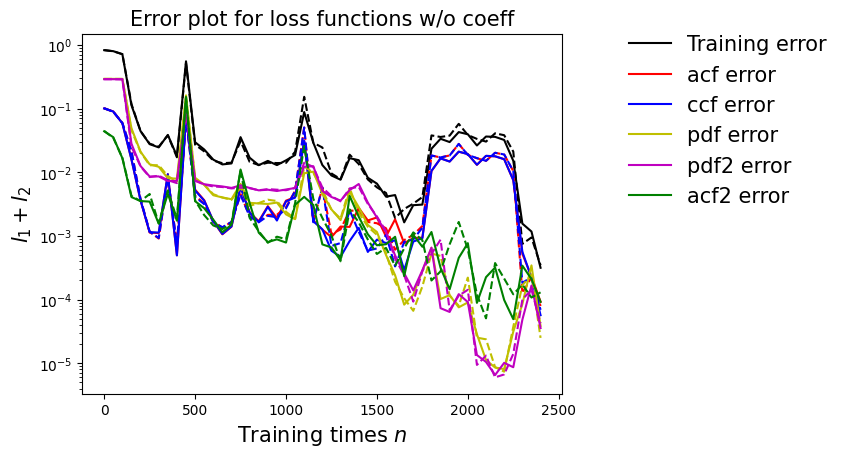

In [41]:
draw_errors(model)

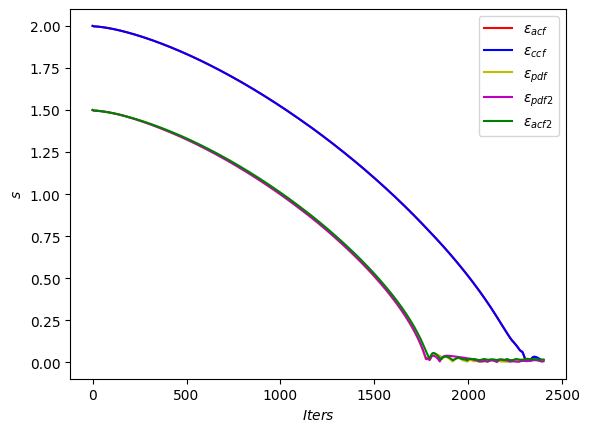

In [42]:
draw_adaptive_w(model)

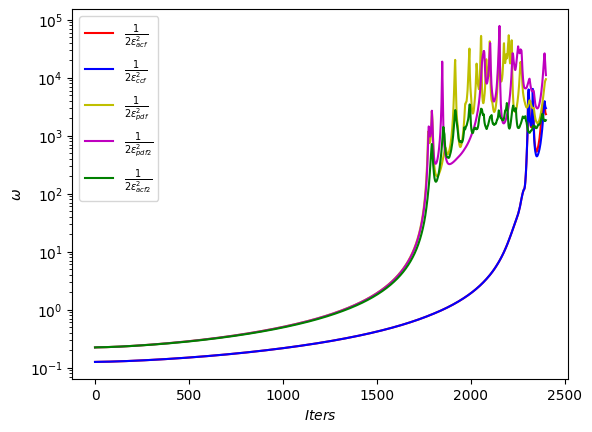

In [43]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [44]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [45]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [46]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [47]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [48]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [49]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [50]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

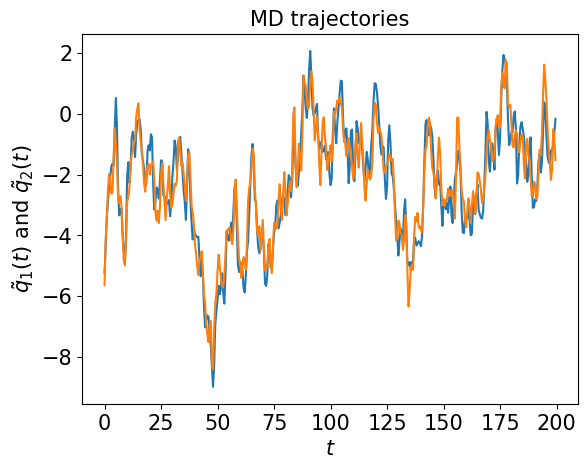

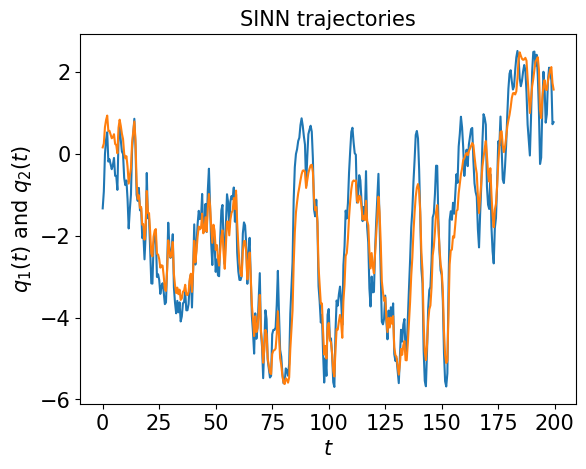

In [51]:
test1(model)

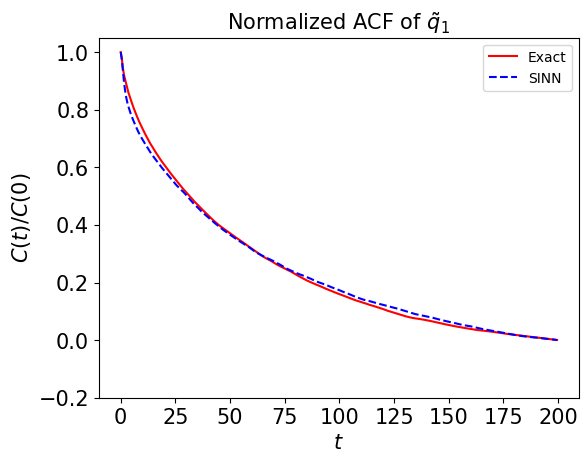

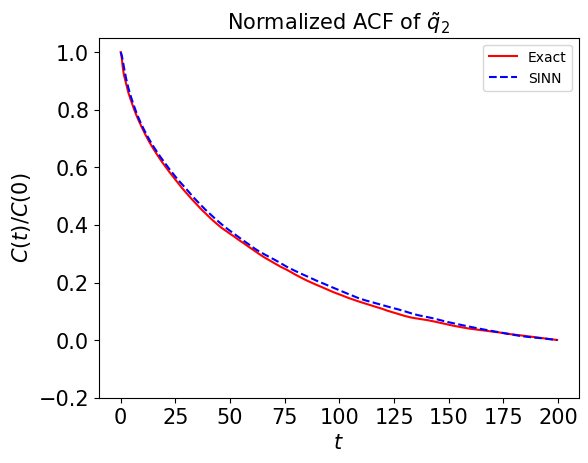

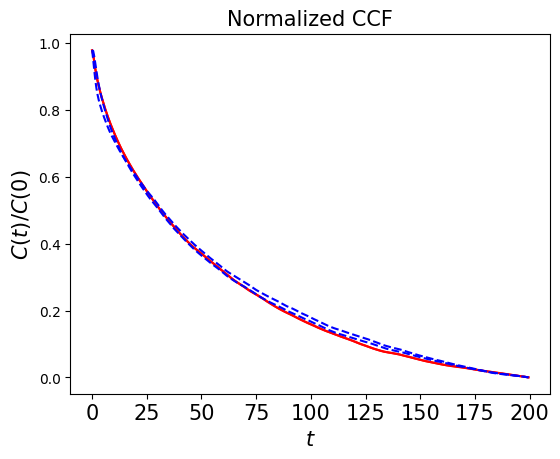

In [52]:
test2(model)

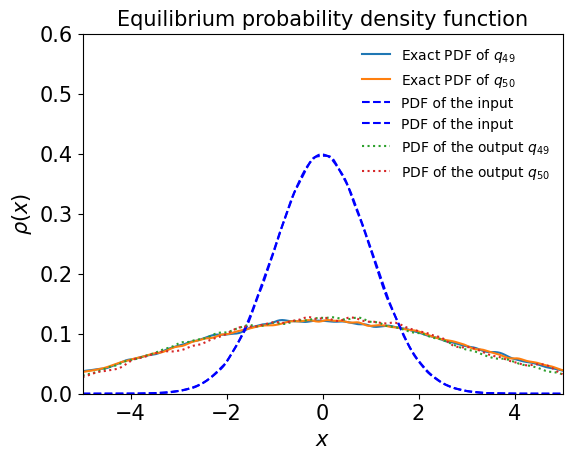

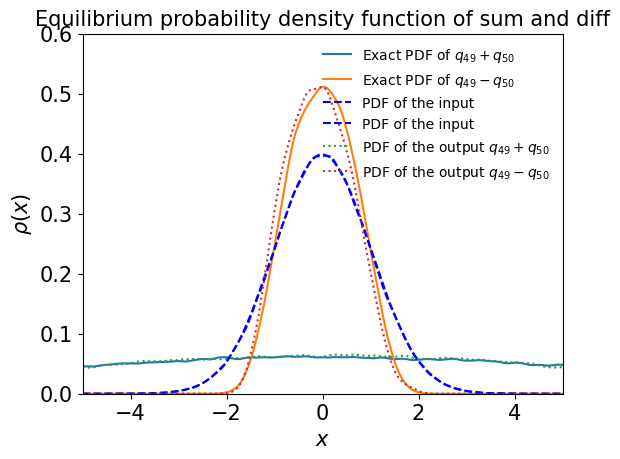

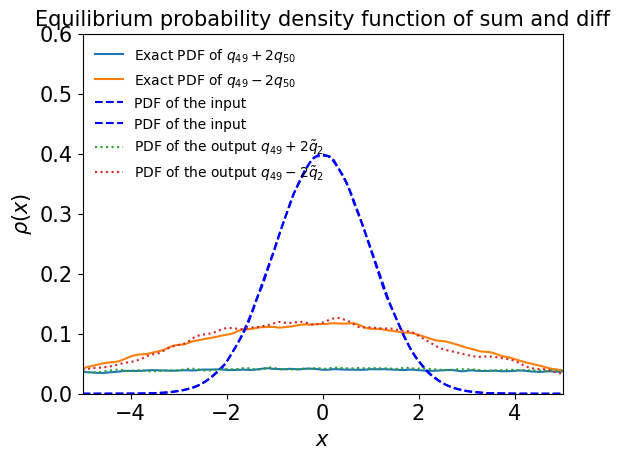

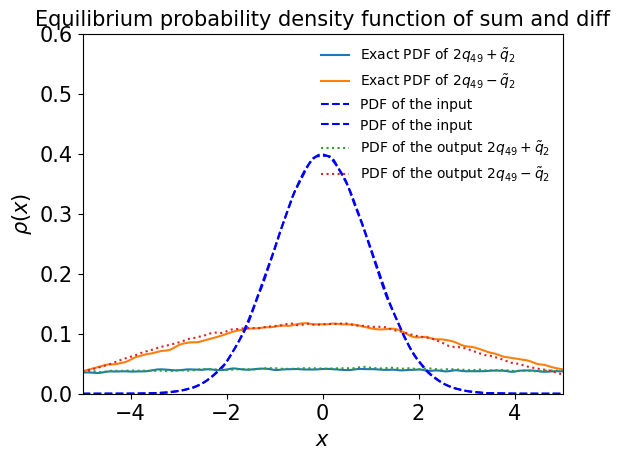

In [53]:
test3(model)

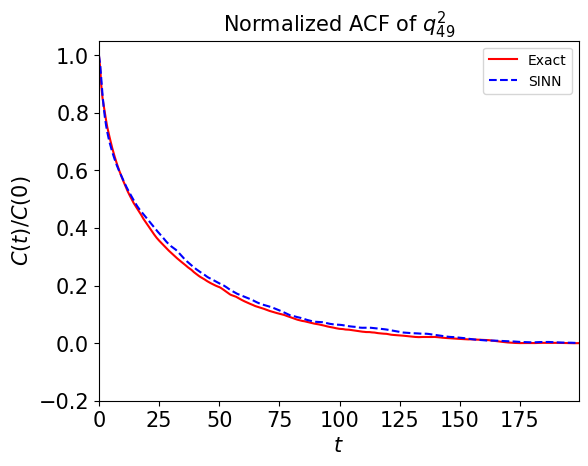

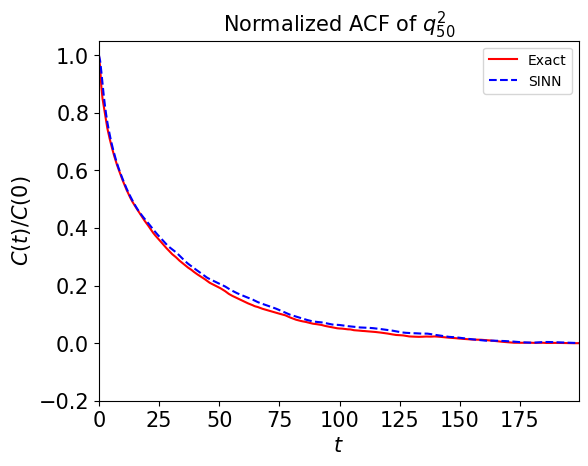

In [54]:
test4(model)

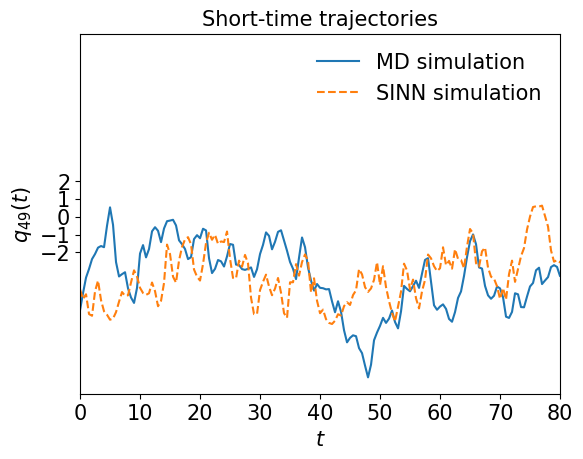

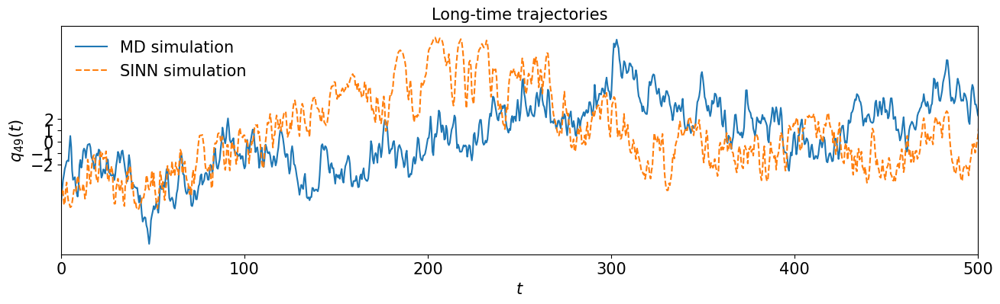

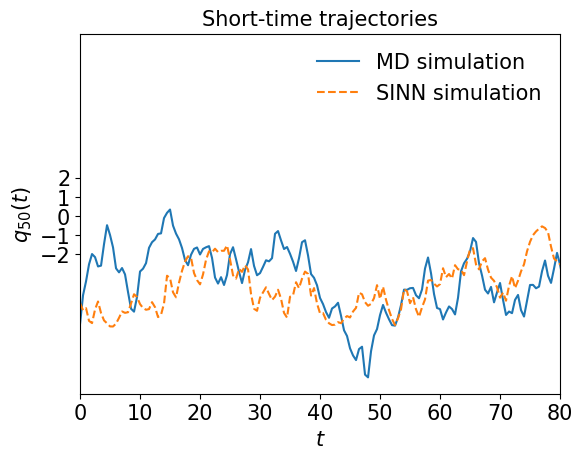

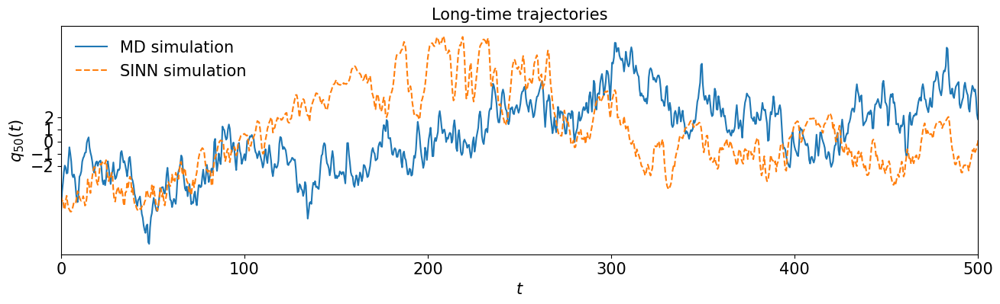

In [55]:
test5(model)

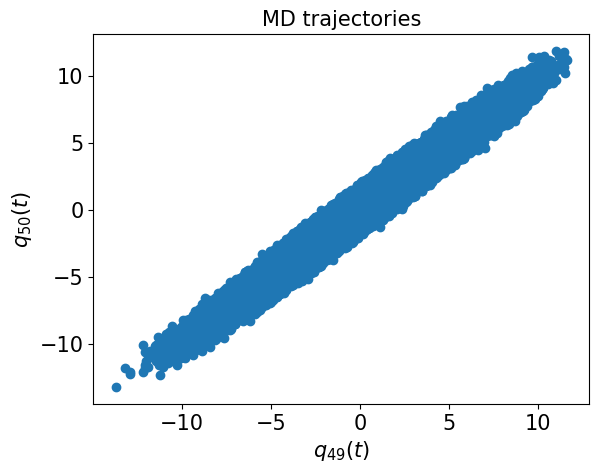

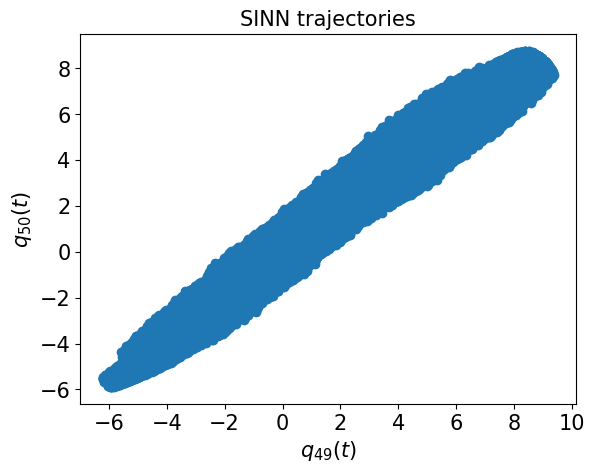

In [56]:
test6(model)

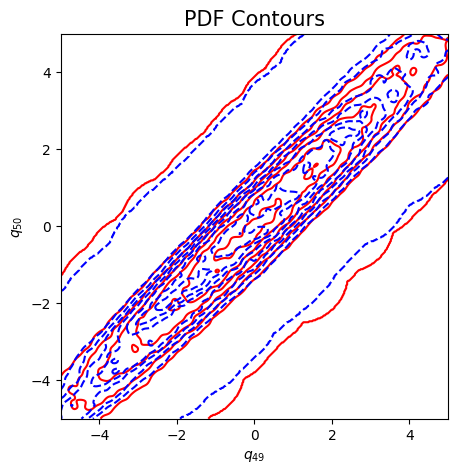

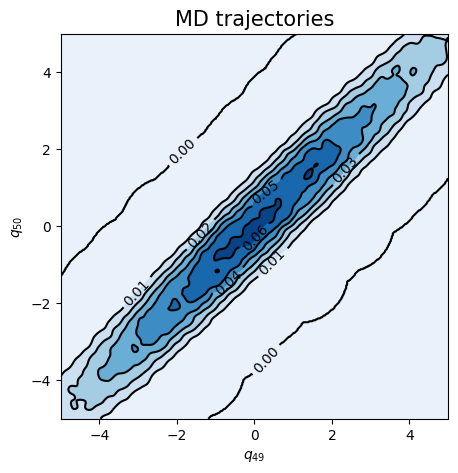

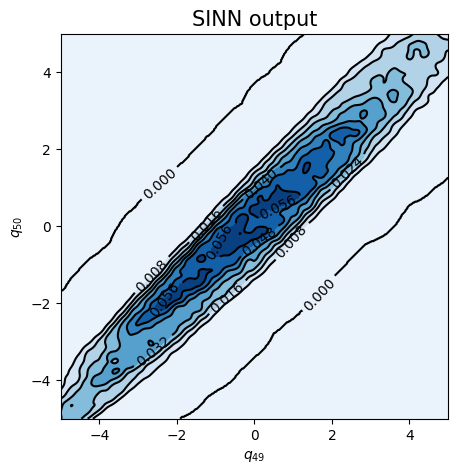

In [57]:
test7(model)

In [58]:
### Defining SINN model
net1 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8608, 0.8607, acf: 0.10070, ccf: 0.13305, pdf: 0.29316, pdf2: 0.28991, acf2: 0.04386
[50]-th step loss: 0.8022, 0.8042, acf: 0.09219, ccf: 0.09198, pdf: 0.29310, pdf2: 0.28964, acf2: 0.03734
[100]-th step loss: 0.7245, 0.7143, acf: 0.05841, ccf: 0.05828, pdf: 0.29278, pdf2: 0.28837, acf2: 0.01643
[150]-th step loss: 0.0842, 0.0755, acf: 0.01137, ccf: 0.01136, pdf: 0.02639, pdf2: 0.02292, acf2: 0.00343
[200]-th step loss: 0.0332, 0.0287, acf: 0.00368, ccf: 0.00370, pdf: 0.00886, pdf2: 0.00780, acf2: 0.00463
[250]-th step loss: 0.0177, 0.0194, acf: 0.00210, ccf: 0.00213, pdf: 0.00601, pdf2: 0.00563, acf2: 0.00352
[300]-th step loss: 0.0151, 0.0142, acf: 0.00176, ccf: 0.00179, pdf: 0.00388, pdf2: 0.00332, acf2: 0.00340
[350]-th step loss: 0.0144, 0.0164, acf: 0.00129, ccf: 0.00131, pdf: 0.00558, pdf2: 0.00547, acf2: 0.00271
[400]-th step loss: 0.0112, 0.0119, acf: 0.00171, ccf: 0.00172, pdf: 0.00278, pdf2: 0.00235, acf2: 0.00337
[450]-th step loss: 0.0503, 0.0403, acf:

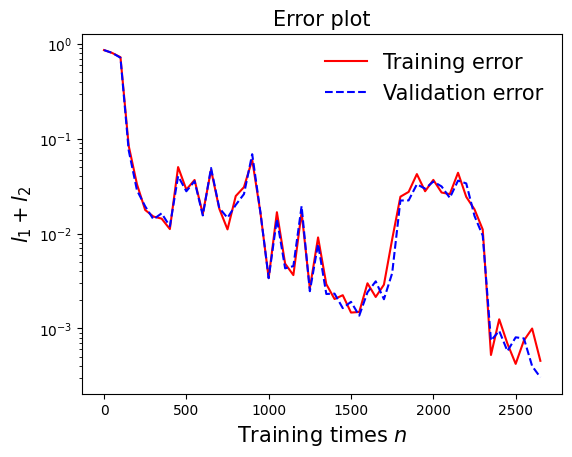

In [59]:
draw_loss(model1)

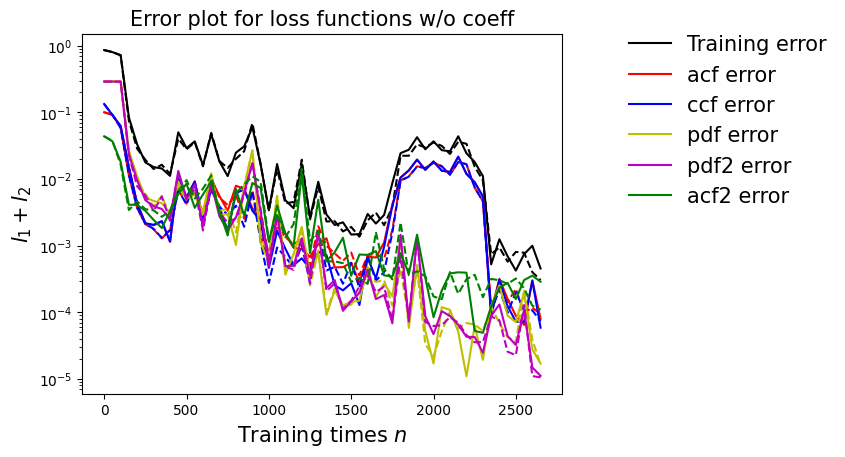

In [60]:
draw_errors(model1)

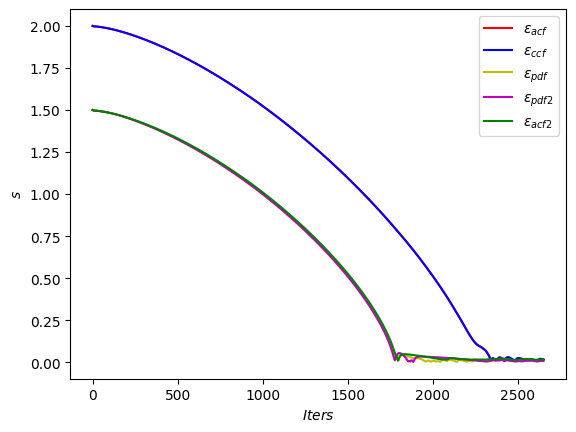

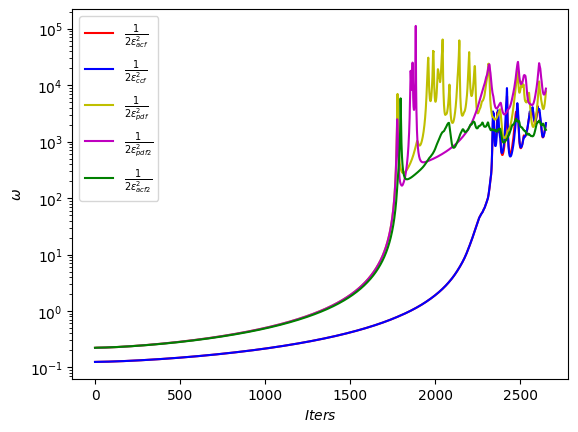

In [61]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

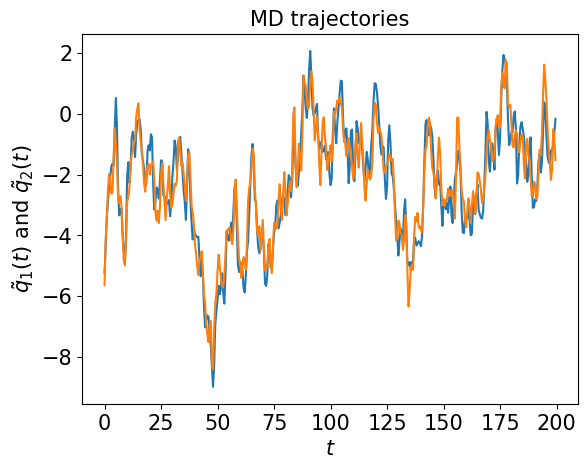

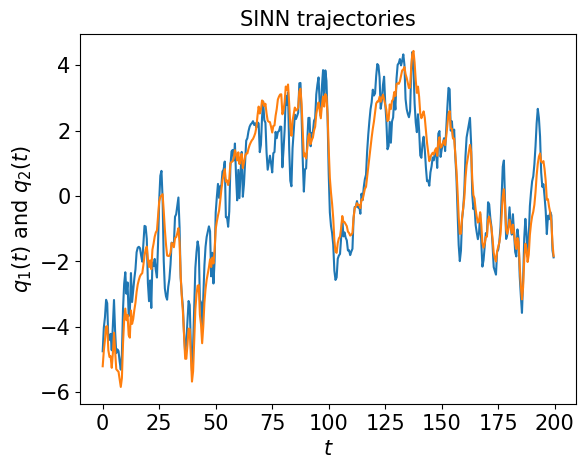

In [62]:
test1(model1)

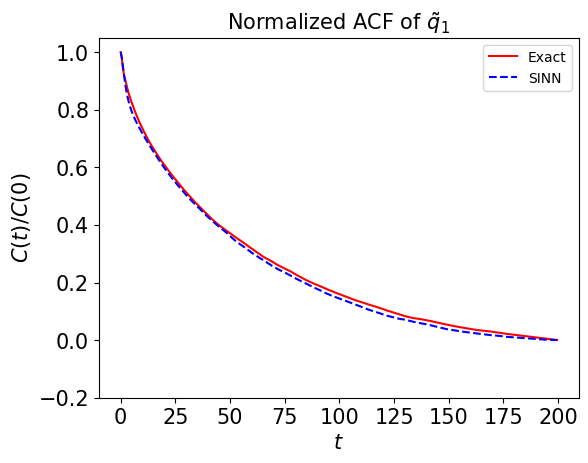

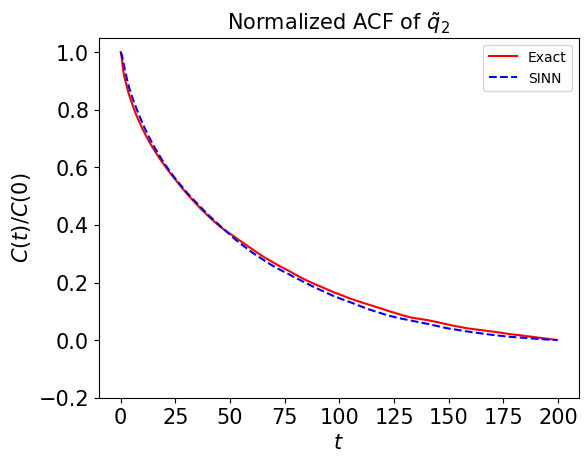

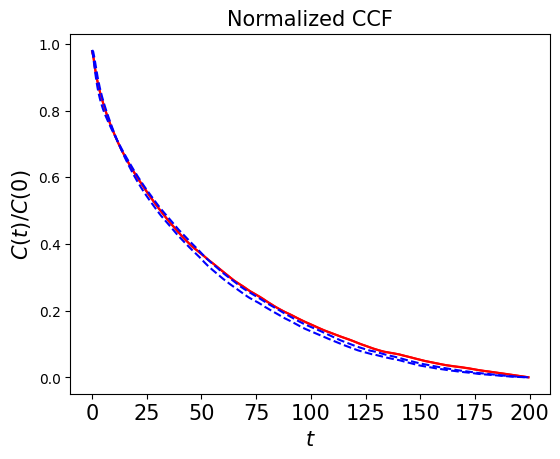

In [63]:
test2(model1)

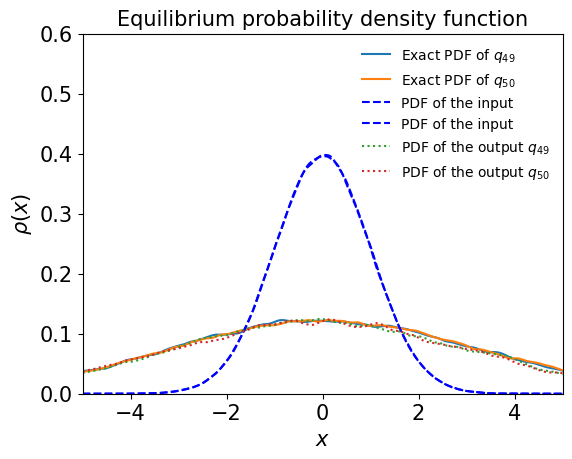

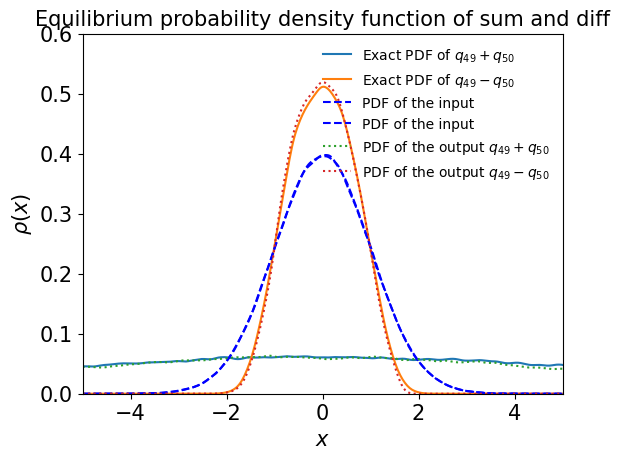

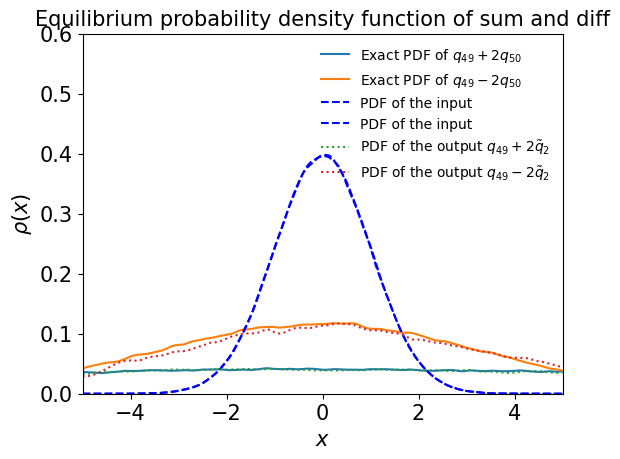

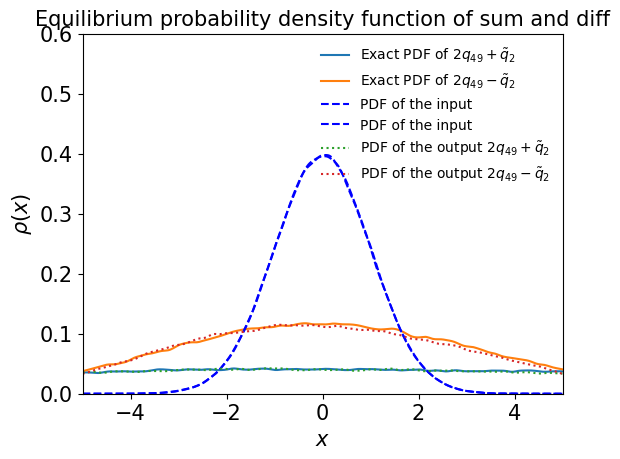

In [64]:
test3(model1)

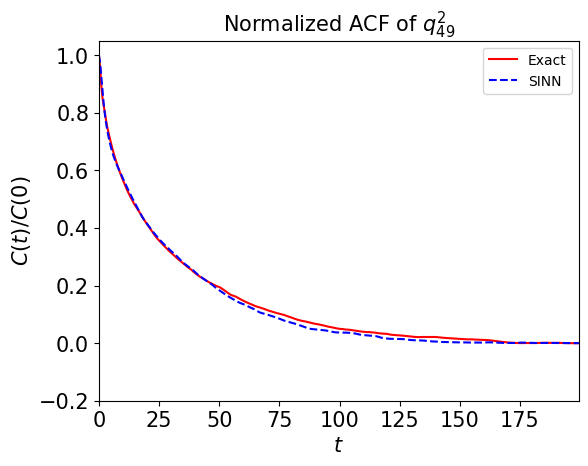

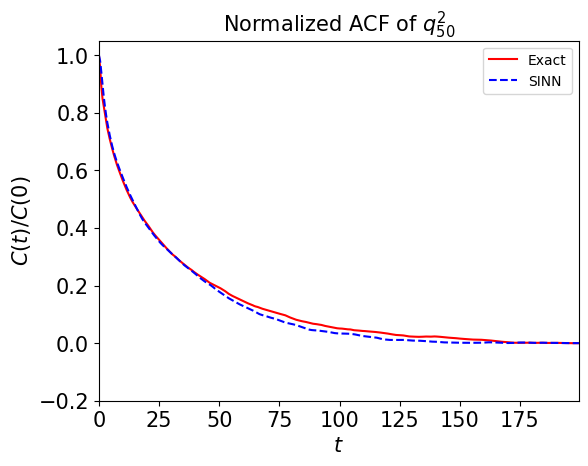

In [65]:
test4(model1)

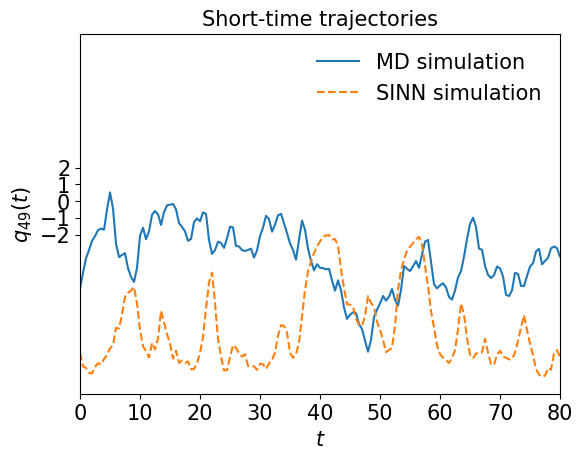

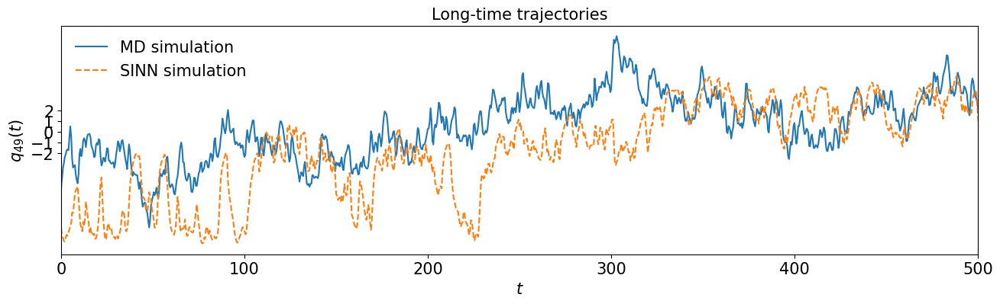

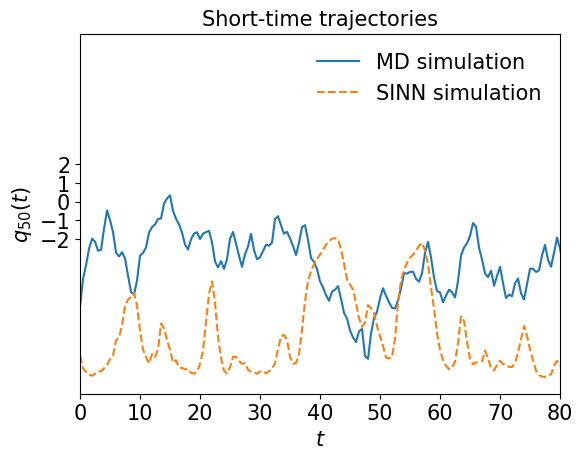

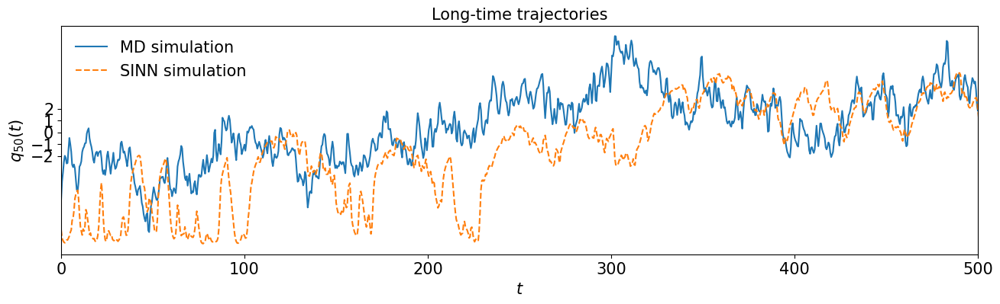

In [66]:
test5(model1)

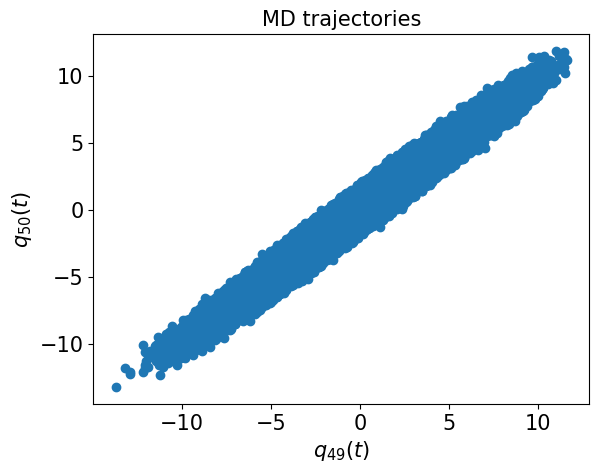

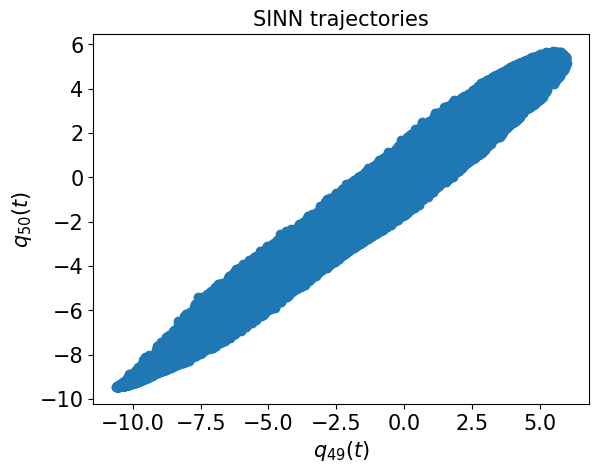

In [67]:
test6(model1)

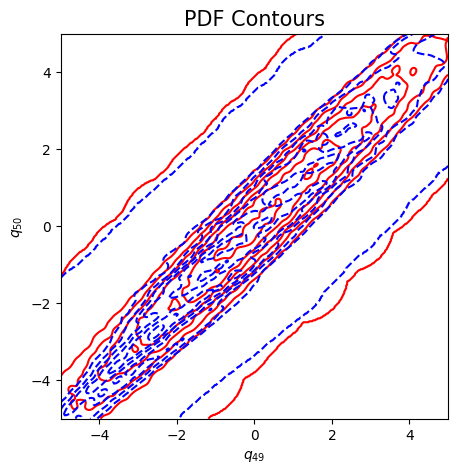

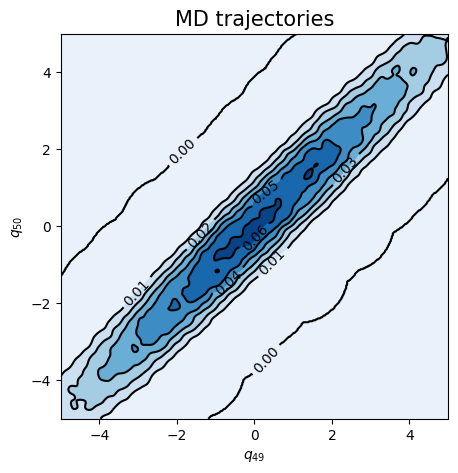

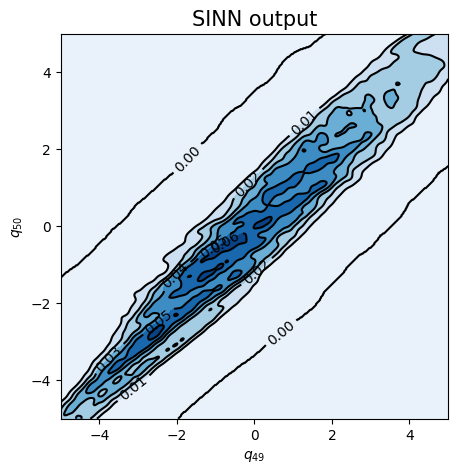

In [68]:
test7(model1)

In [69]:
### Defining SINN model
net2 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8396, 0.8390, acf: 0.10301, ccf: 0.10698, pdf: 0.29315, pdf2: 0.28995, acf2: 0.04588
[50]-th step loss: 0.8006, 0.8027, acf: 0.09186, ccf: 0.09156, pdf: 0.29305, pdf2: 0.28950, acf2: 0.03675
[100]-th step loss: 0.7019, 0.6785, acf: 0.07162, ccf: 0.07164, pdf: 0.27551, pdf2: 0.23463, acf2: 0.02506
[150]-th step loss: 0.0667, 0.0757, acf: 0.01804, ccf: 0.01801, pdf: 0.02355, pdf2: 0.01247, acf2: 0.00359
[200]-th step loss: 0.0592, 0.0610, acf: 0.01640, ccf: 0.01639, pdf: 0.01587, pdf2: 0.00959, acf2: 0.00273
[250]-th step loss: 0.0247, 0.0270, acf: 0.00270, ccf: 0.00270, pdf: 0.01168, pdf2: 0.00794, acf2: 0.00204
[300]-th step loss: 0.0152, 0.0190, acf: 0.00126, ccf: 0.00123, pdf: 0.00746, pdf2: 0.00652, acf2: 0.00256
[350]-th step loss: 0.0135, 0.0174, acf: 0.00157, ccf: 0.00156, pdf: 0.00609, pdf2: 0.00586, acf2: 0.00233
[400]-th step loss: 0.0113, 0.0131, acf: 0.00091, ccf: 0.00090, pdf: 0.00490, pdf2: 0.00560, acf2: 0.00075
[450]-th step loss: 0.0999, 0.0486, acf:

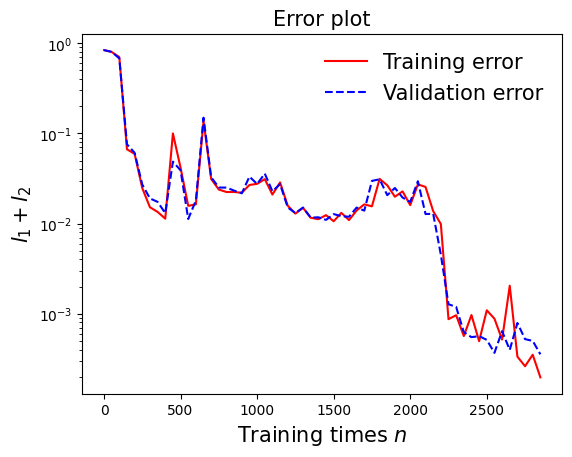

In [70]:
draw_loss(model2)

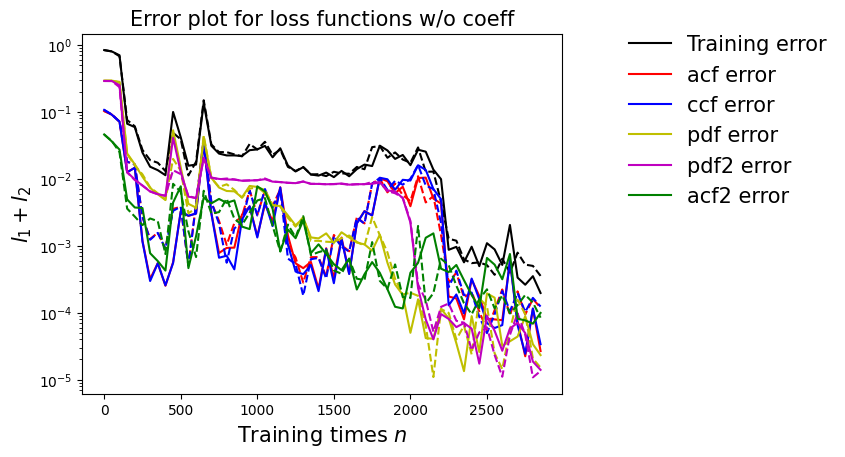

In [71]:
draw_errors(model2)

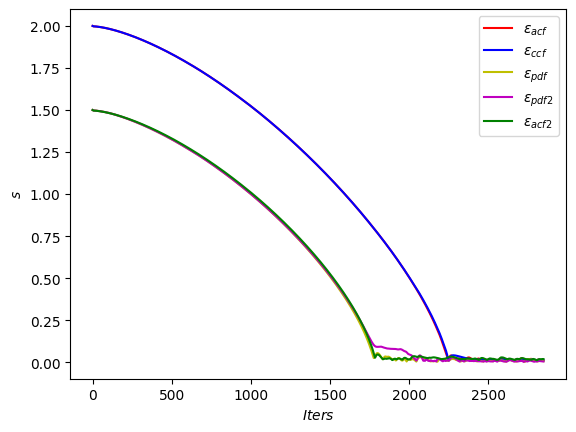

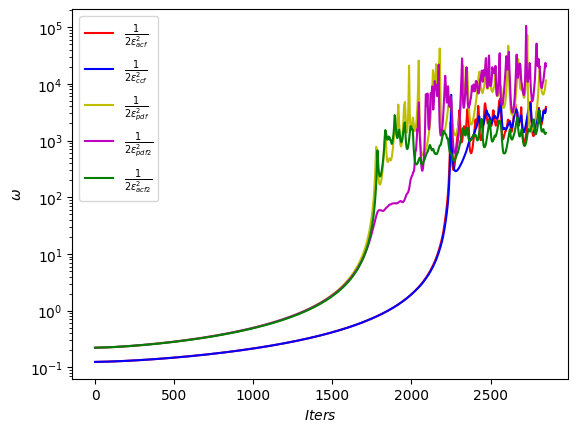

In [72]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

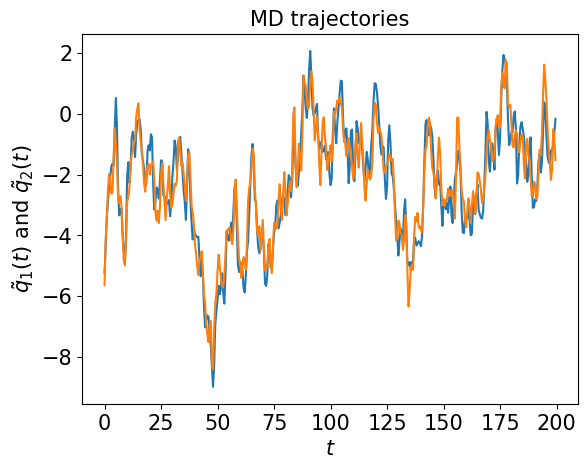

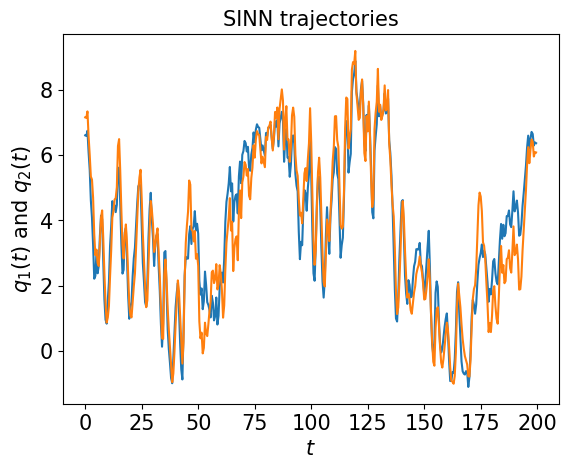

In [73]:
test1(model2)

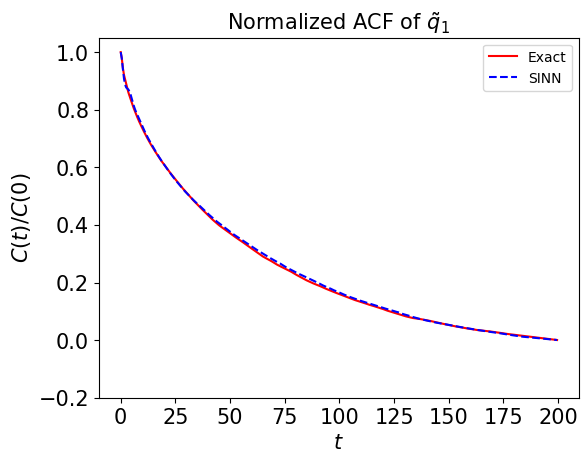

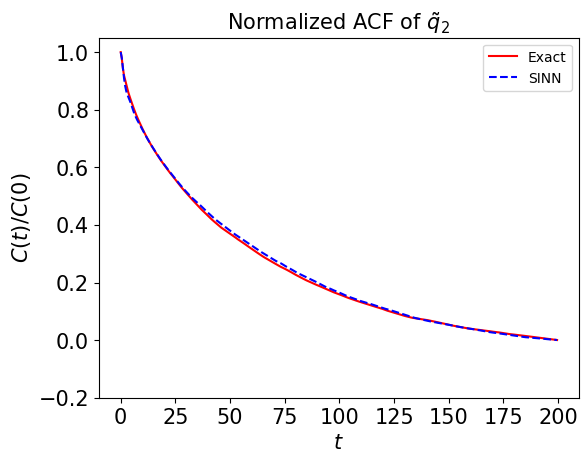

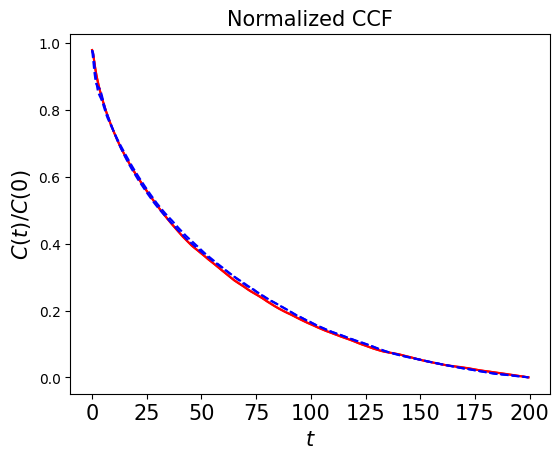

In [74]:
test2(model2)

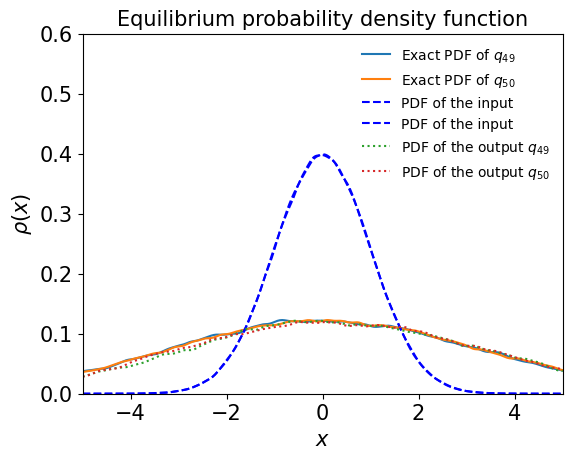

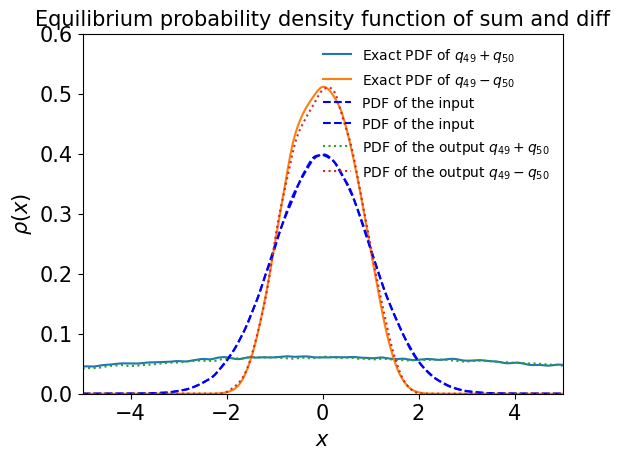

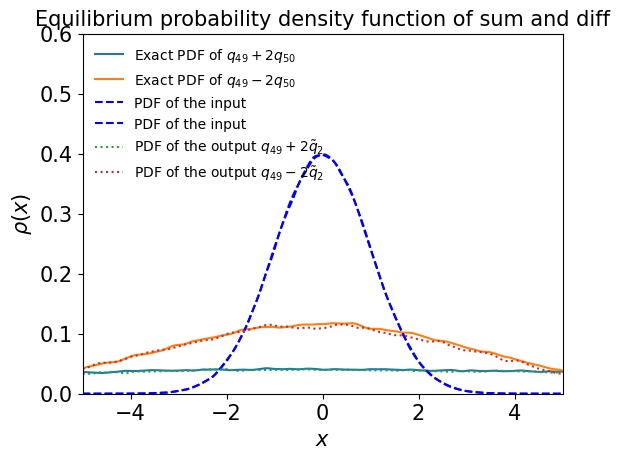

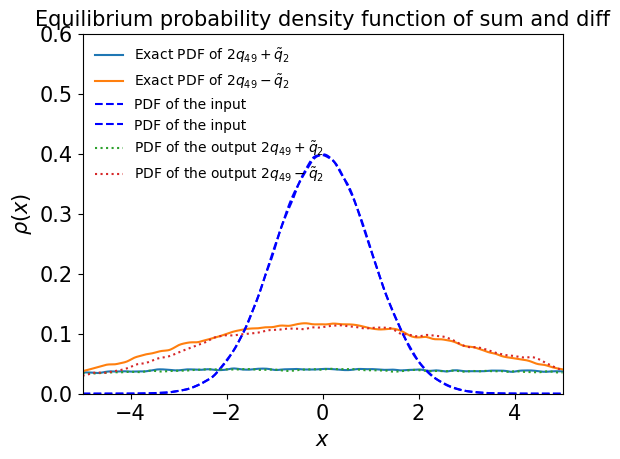

In [75]:
test3(model2)

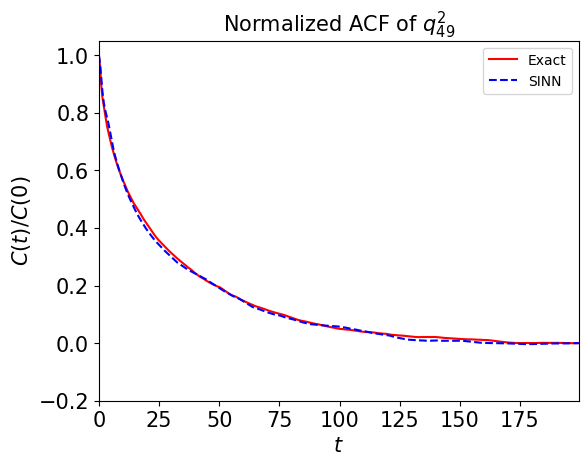

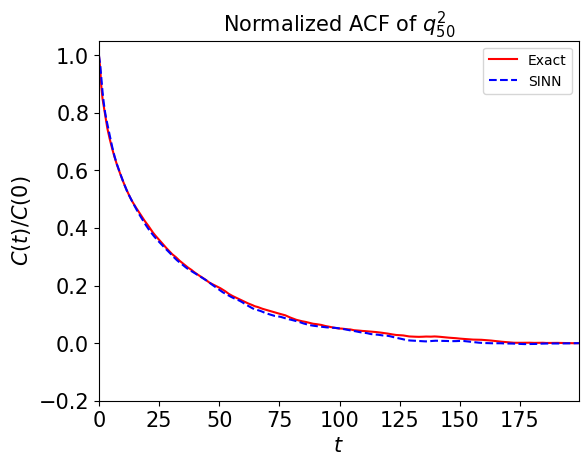

In [76]:
test4(model2)

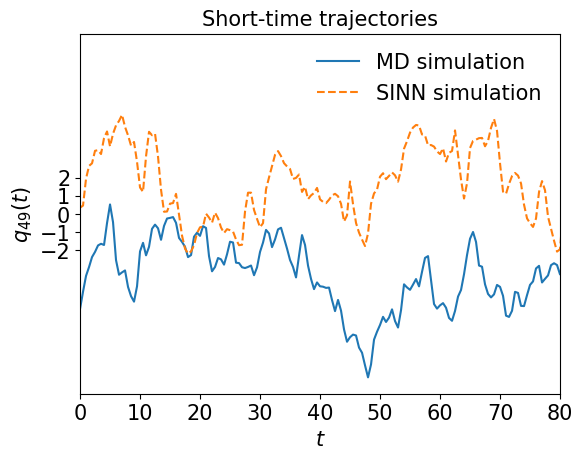

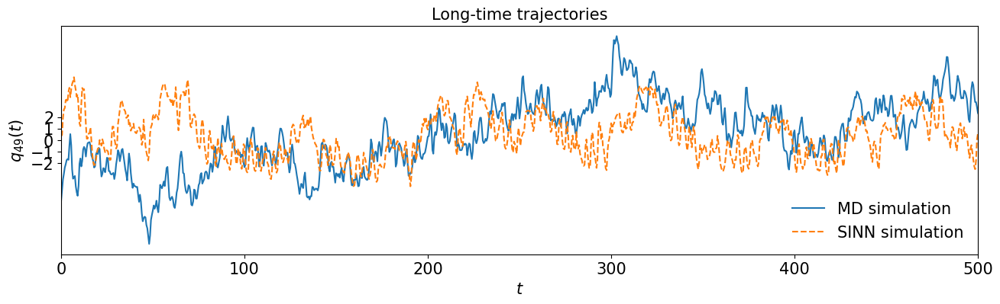

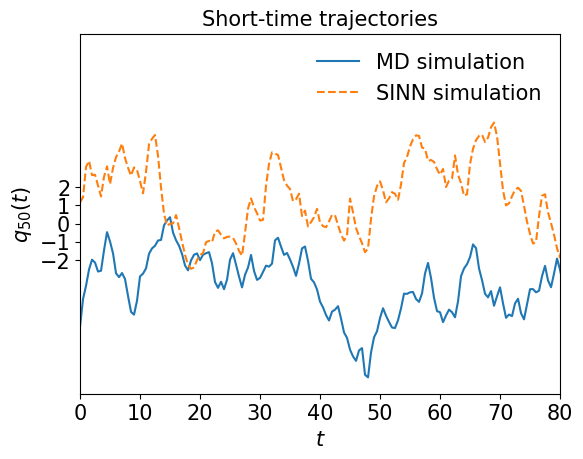

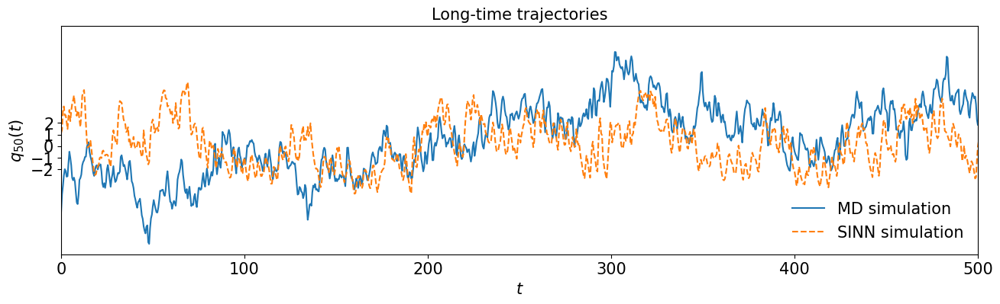

In [77]:
test5(model2)

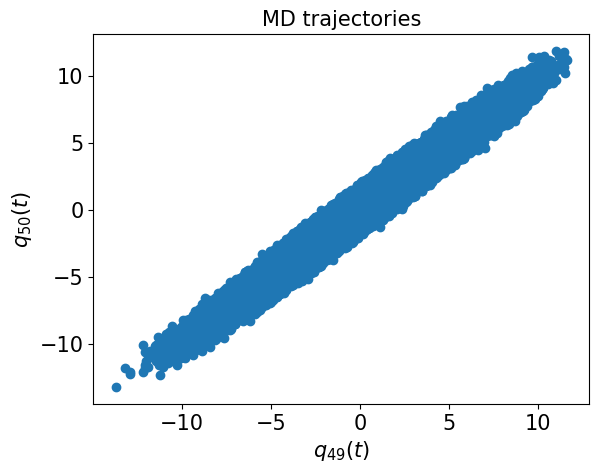

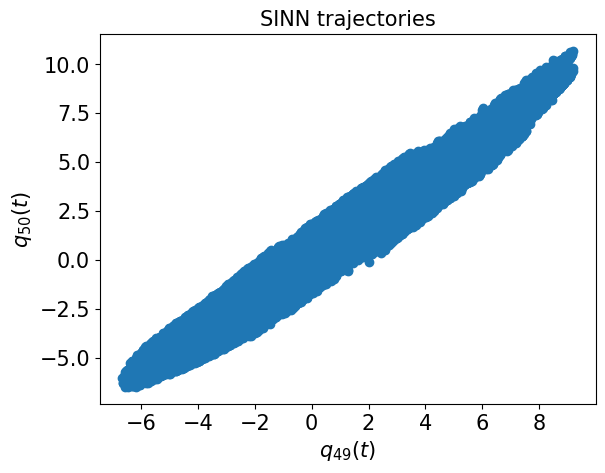

In [78]:
test6(model2)

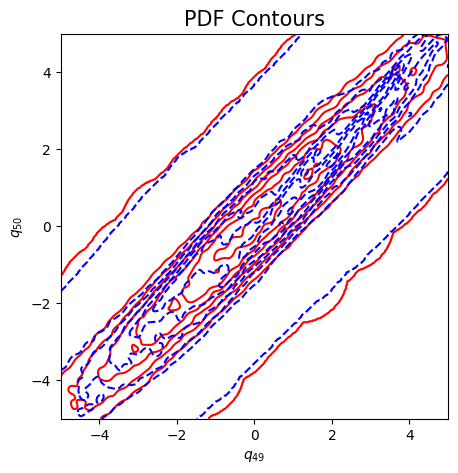

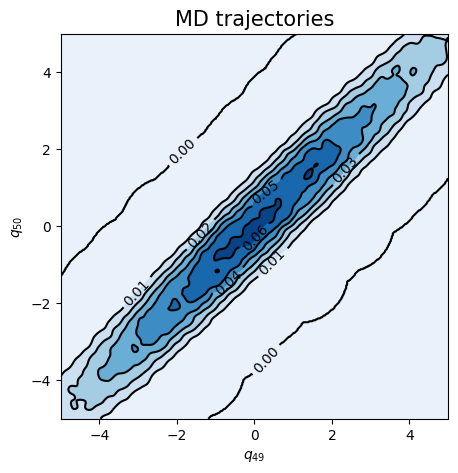

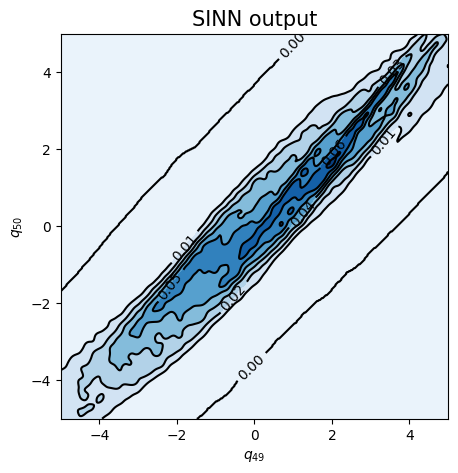

In [79]:
test7(model2)

In [81]:
### Defining SINN model
net3 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8220, 0.8248, acf: 0.09932, ccf: 0.09985, pdf: 0.29313, pdf2: 0.28981, acf2: 0.04271
[50]-th step loss: 0.7878, 0.7909, acf: 0.08737, ccf: 0.08715, pdf: 0.29316, pdf2: 0.28988, acf2: 0.03334
[100]-th step loss: 0.2682, 0.4253, acf: 0.01077, ccf: 0.01084, pdf: 0.21330, pdf2: 0.18419, acf2: 0.00619
[150]-th step loss: 0.0582, 0.0544, acf: 0.00467, ccf: 0.00468, pdf: 0.02636, pdf2: 0.01446, acf2: 0.00419
[200]-th step loss: 0.0318, 0.0321, acf: 0.00298, ccf: 0.00299, pdf: 0.01388, pdf2: 0.00841, acf2: 0.00381
[250]-th step loss: 0.0236, 0.0257, acf: 0.00216, ccf: 0.00217, pdf: 0.01089, pdf2: 0.00806, acf2: 0.00238
[300]-th step loss: 0.0169, 0.0187, acf: 0.00078, ccf: 0.00082, pdf: 0.00889, pdf2: 0.00657, acf2: 0.00164
[350]-th step loss: 0.0208, 0.0203, acf: 0.00196, ccf: 0.00176, pdf: 0.00855, pdf2: 0.00661, acf2: 0.00137
[400]-th step loss: 0.0129, 0.0113, acf: 0.00092, ccf: 0.00079, pdf: 0.00409, pdf2: 0.00442, acf2: 0.00102
[450]-th step loss: 0.0111, 0.0104, acf:

[3850]-th step loss: 0.0004, 0.0004, acf: 0.00009, ccf: 0.00010, pdf: 0.00006, pdf2: 0.00003, acf2: 0.00008
Training finished
Training time: 452.51
Training time per iteration: 0.12
Number of Iterations:3851


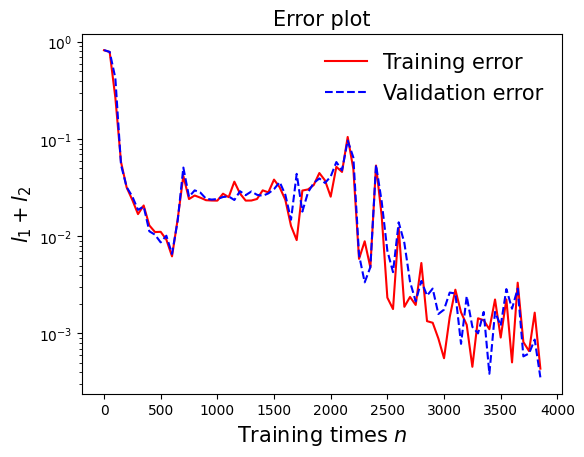

In [82]:
draw_loss(model3)

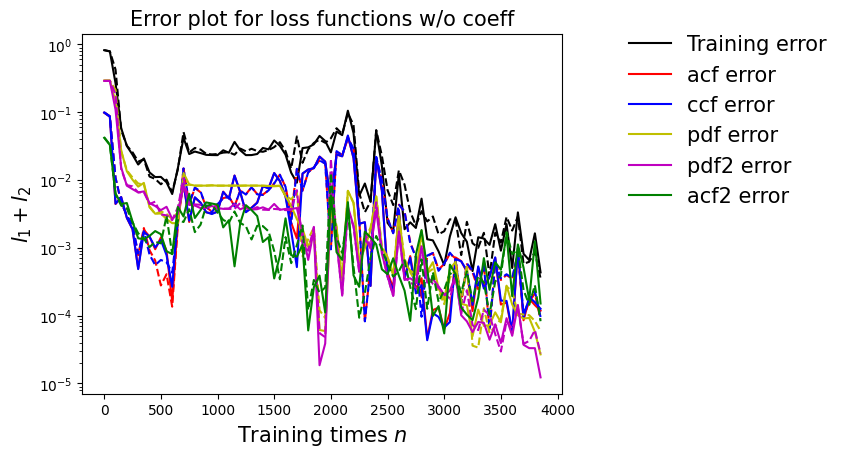

In [83]:
draw_errors(model3)

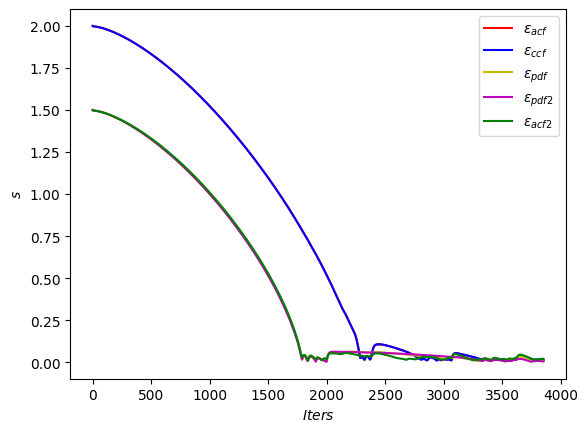

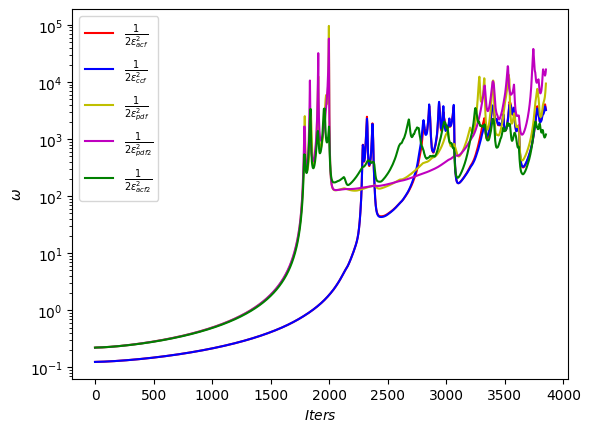

In [84]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

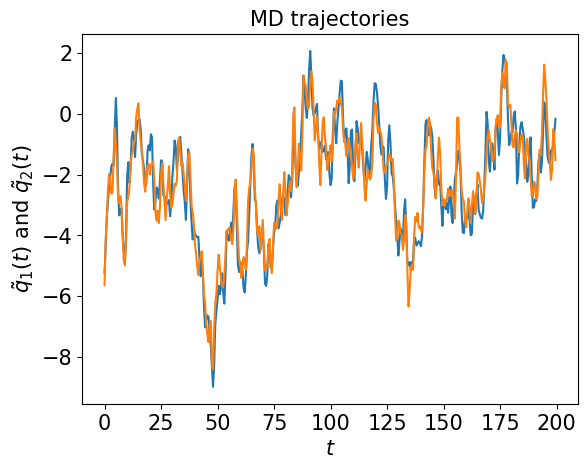

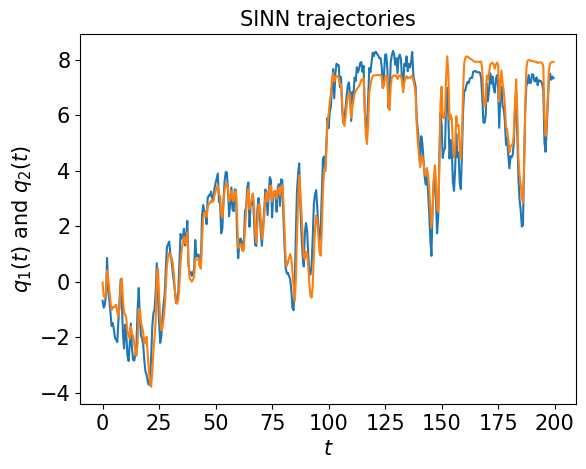

In [85]:
test1(model3)

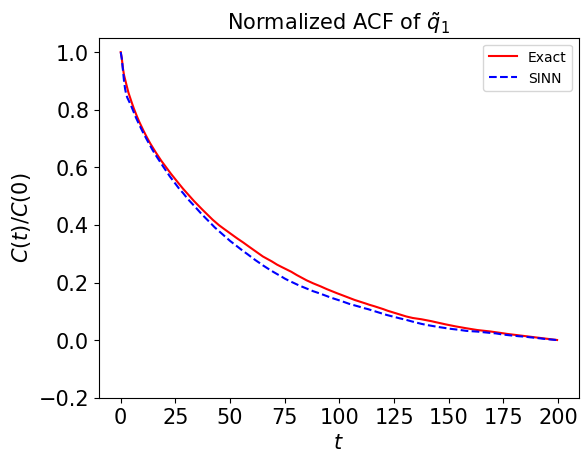

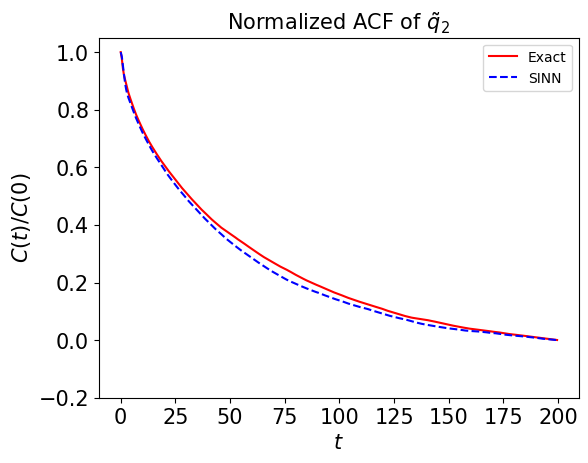

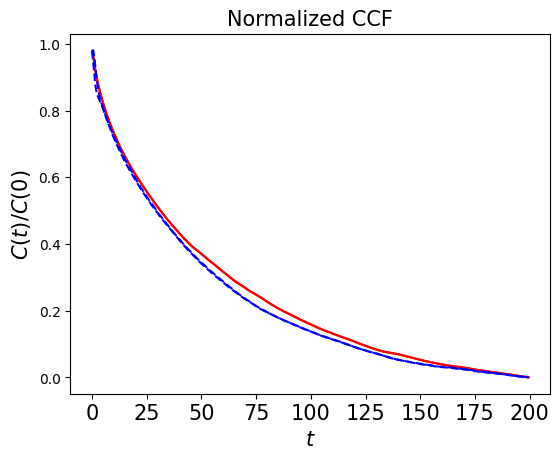

In [86]:
test2(model3)

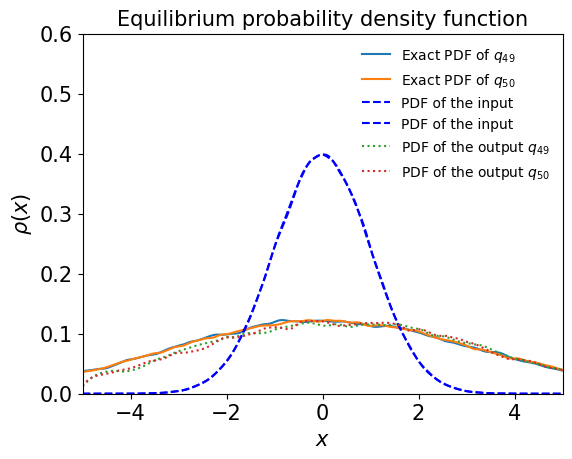

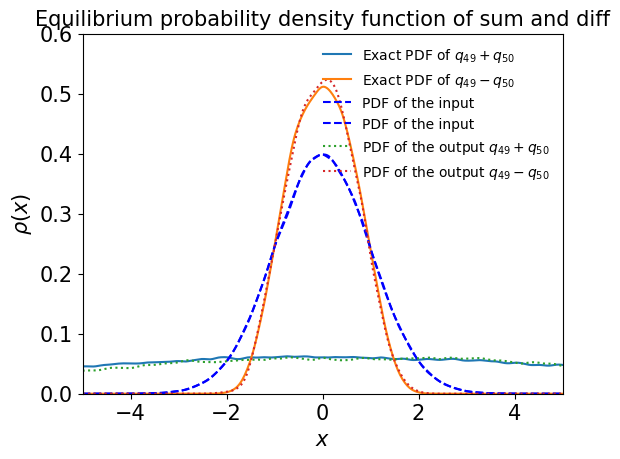

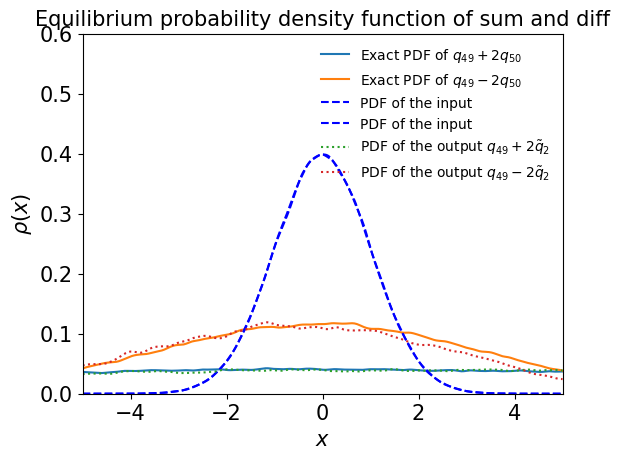

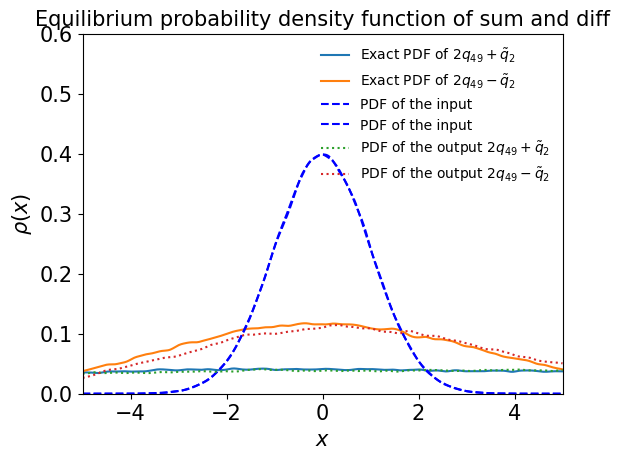

In [87]:
test3(model3)

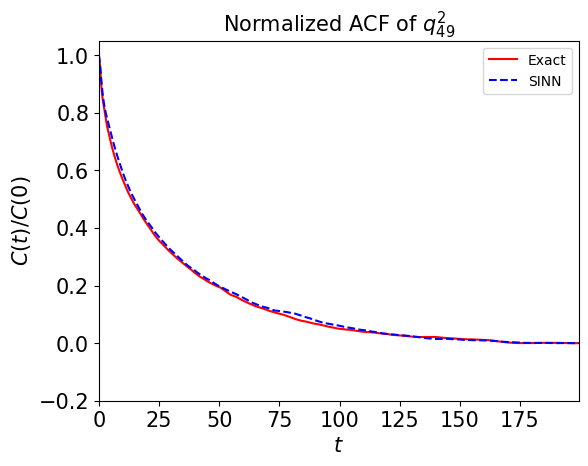

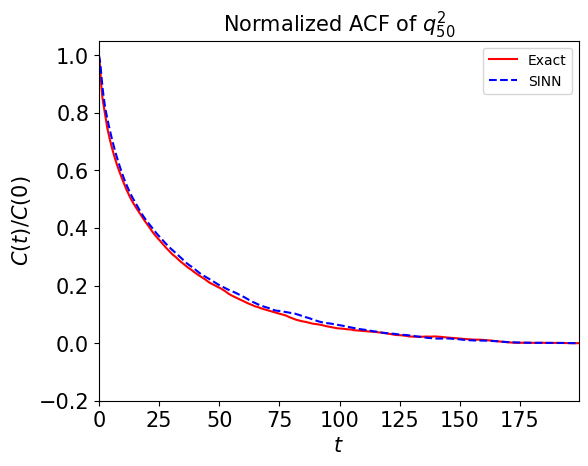

In [88]:
test4(model3)

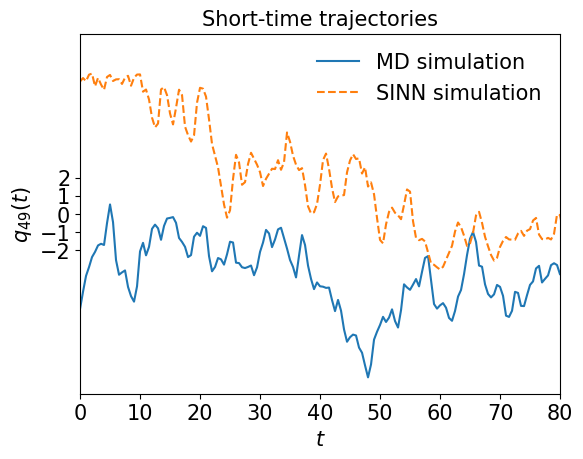

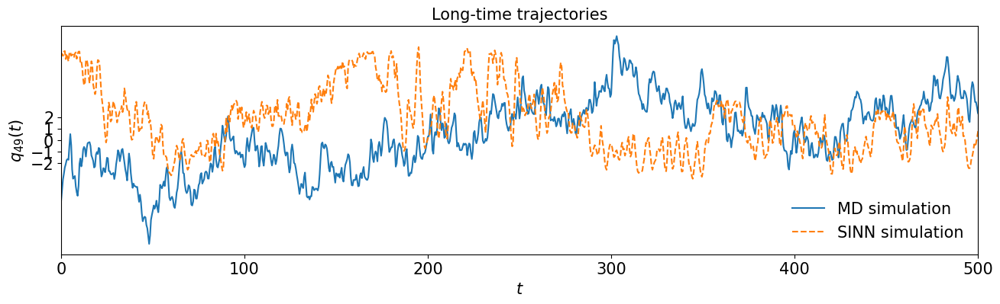

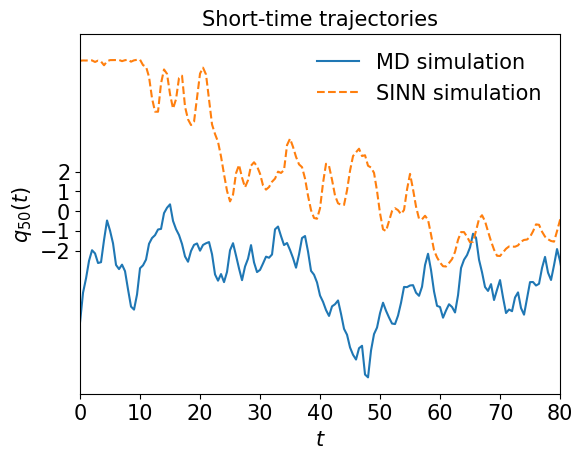

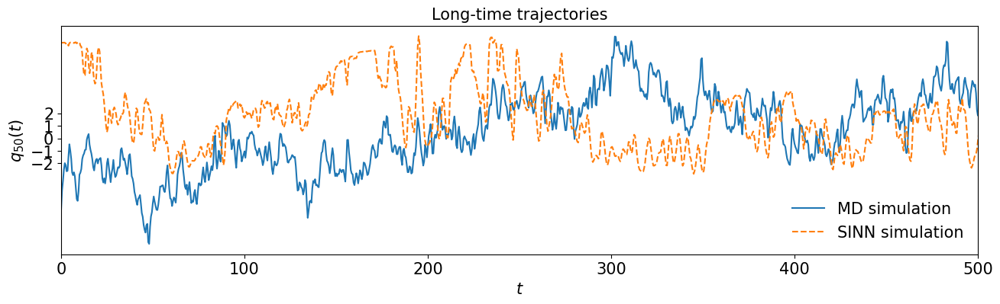

In [89]:
test5(model3)

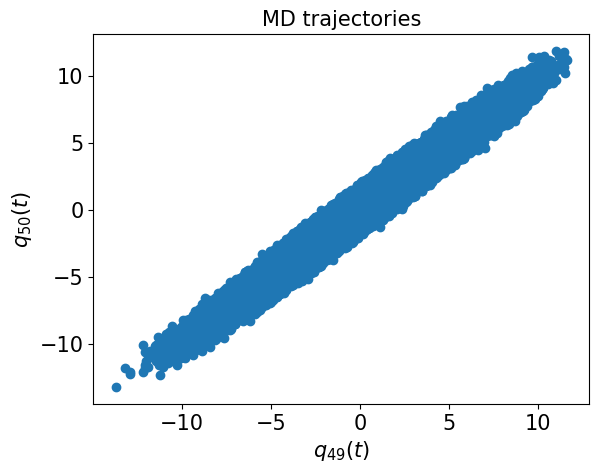

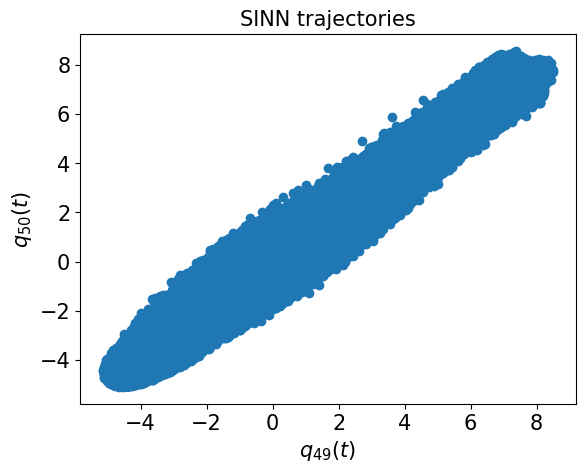

In [90]:
test6(model3)

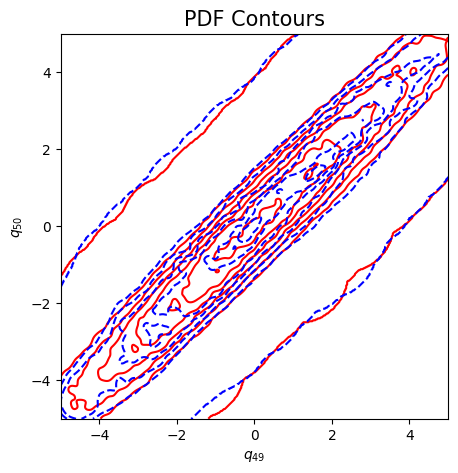

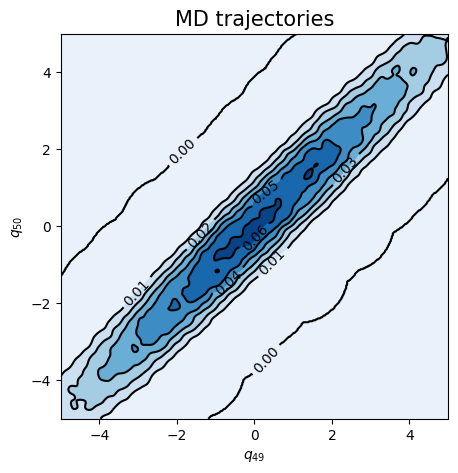

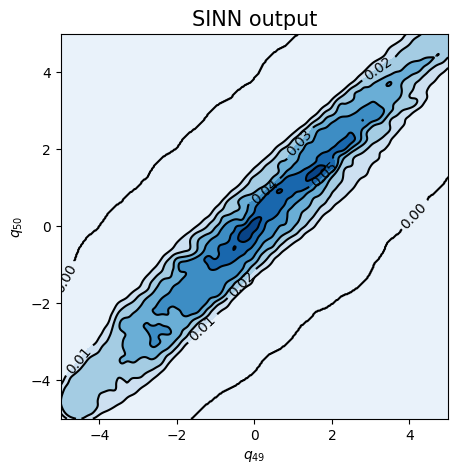

In [91]:
test7(model3)

In [92]:
### Defining SINN model
net4 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8593, 0.8590, acf: 0.09975, ccf: 0.13296, pdf: 0.29320, pdf2: 0.28983, acf2: 0.04330
[50]-th step loss: 0.8079, 0.8076, acf: 0.09359, ccf: 0.09340, pdf: 0.29311, pdf2: 0.28943, acf2: 0.03808
[100]-th step loss: 0.4665, 0.4135, acf: 0.04032, ccf: 0.04050, pdf: 0.21205, pdf2: 0.11173, acf2: 0.00887
[150]-th step loss: 0.0557, 0.0531, acf: 0.00288, ccf: 0.00289, pdf: 0.02993, pdf2: 0.01525, acf2: 0.00211
[200]-th step loss: 0.0312, 0.0319, acf: 0.00191, ccf: 0.00193, pdf: 0.01628, pdf2: 0.00971, acf2: 0.00209
[250]-th step loss: 0.0215, 0.0223, acf: 0.00073, ccf: 0.00075, pdf: 0.01193, pdf2: 0.00780, acf2: 0.00111
[300]-th step loss: 0.0238, 0.0169, acf: 0.00029, ccf: 0.00030, pdf: 0.00873, pdf2: 0.00666, acf2: 0.00089
[350]-th step loss: 0.0177, 0.0157, acf: 0.00078, ccf: 0.00080, pdf: 0.00701, pdf2: 0.00610, acf2: 0.00103
[400]-th step loss: 0.0165, 0.0167, acf: 0.00098, ccf: 0.00101, pdf: 0.00746, pdf2: 0.00622, acf2: 0.00108
[450]-th step loss: 0.0127, 0.0117, acf:

[3850]-th step loss: 0.0873, 0.0872, acf: 0.01709, ccf: 0.01702, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00009
[3900]-th step loss: 0.0801, 0.0834, acf: 0.01514, ccf: 0.01508, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00013
[3950]-th step loss: 0.0874, 0.0882, acf: 0.01757, ccf: 0.01749, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00013
[4000]-th step loss: 0.0766, 0.0846, acf: 0.01581, ccf: 0.01573, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00003
[4050]-th step loss: 0.0820, 0.0881, acf: 0.01752, ccf: 0.01744, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00013
[4100]-th step loss: 0.0872, 0.0873, acf: 0.01710, ccf: 0.01703, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00009
[4150]-th step loss: 0.0825, 0.0876, acf: 0.01724, ccf: 0.01717, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00011
[4200]-th step loss: 0.0836, 0.0847, acf: 0.01584, ccf: 0.01576, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00005
[4250]-th step loss: 0.0812, 0.0903, acf: 0.01854, ccf: 0.01846, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00027
[4300]-th step loss: 0.0798,

[7650]-th step loss: 0.0873, 0.0863, acf: 0.01665, ccf: 0.01658, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00006
[7700]-th step loss: 0.0845, 0.0899, acf: 0.01835, ccf: 0.01827, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00020
[7750]-th step loss: 0.0876, 0.0873, acf: 0.01711, ccf: 0.01703, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00010
[7800]-th step loss: 0.0798, 0.0836, acf: 0.01532, ccf: 0.01525, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00003
[7850]-th step loss: 0.0745, 0.0842, acf: 0.01560, ccf: 0.01552, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00003
[7900]-th step loss: 0.0759, 0.0853, acf: 0.01613, ccf: 0.01605, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00005
[7950]-th step loss: 0.0804, 0.0882, acf: 0.01755, ccf: 0.01748, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00013
[8000]-th step loss: 0.0818, 0.0856, acf: 0.01630, ccf: 0.01622, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00005
[8050]-th step loss: 0.0934, 0.0882, acf: 0.01755, ccf: 0.01748, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00013
[8100]-th step loss: 0.0891,

[11450]-th step loss: 0.0767, 0.0833, acf: 0.01517, ccf: 0.01510, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00003
[11500]-th step loss: 0.0878, 0.0869, acf: 0.01694, ccf: 0.01686, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00008
[11550]-th step loss: 0.0823, 0.0839, acf: 0.01545, ccf: 0.01538, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00003
[11600]-th step loss: 0.0781, 0.0864, acf: 0.01666, ccf: 0.01659, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00007
[11650]-th step loss: 0.0802, 0.0874, acf: 0.01714, ccf: 0.01707, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00013
[11700]-th step loss: 0.0787, 0.0878, acf: 0.01738, ccf: 0.01730, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00012
[11750]-th step loss: 0.0804, 0.0879, acf: 0.01740, ccf: 0.01733, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00012
[11800]-th step loss: 0.0825, 0.0868, acf: 0.01688, ccf: 0.01681, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00009
[11850]-th step loss: 0.0837, 0.0890, acf: 0.01793, ccf: 0.01785, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00016
[11900]-th step los

[15250]-th step loss: 0.0805, 0.0864, acf: 0.01668, ccf: 0.01661, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[15300]-th step loss: 0.0758, 0.0869, acf: 0.01693, ccf: 0.01685, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00008
[15350]-th step loss: 0.0826, 0.0853, acf: 0.01615, ccf: 0.01607, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00004
[15400]-th step loss: 0.0844, 0.0878, acf: 0.01735, ccf: 0.01727, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00011
[15450]-th step loss: 0.0869, 0.0875, acf: 0.01724, ccf: 0.01716, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00010
[15500]-th step loss: 0.0825, 0.0869, acf: 0.01693, ccf: 0.01685, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00008
[15550]-th step loss: 0.0823, 0.0873, acf: 0.01713, ccf: 0.01705, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00009
[15600]-th step loss: 0.0822, 0.0873, acf: 0.01713, ccf: 0.01705, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00010
[15650]-th step loss: 0.0889, 0.0871, acf: 0.01701, ccf: 0.01693, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00009
[15700]-th step los

[19050]-th step loss: 0.0860, 0.0866, acf: 0.01676, ccf: 0.01669, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19100]-th step loss: 0.0836, 0.0865, acf: 0.01674, ccf: 0.01666, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19150]-th step loss: 0.0785, 0.0865, acf: 0.01676, ccf: 0.01668, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19200]-th step loss: 0.0758, 0.0865, acf: 0.01671, ccf: 0.01664, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19250]-th step loss: 0.0785, 0.0865, acf: 0.01673, ccf: 0.01665, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19300]-th step loss: 0.0871, 0.0866, acf: 0.01679, ccf: 0.01672, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19350]-th step loss: 0.0809, 0.0866, acf: 0.01679, ccf: 0.01671, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19400]-th step loss: 0.0816, 0.0866, acf: 0.01679, ccf: 0.01671, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19450]-th step loss: 0.0831, 0.0865, acf: 0.01674, ccf: 0.01666, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00007
[19500]-th step los

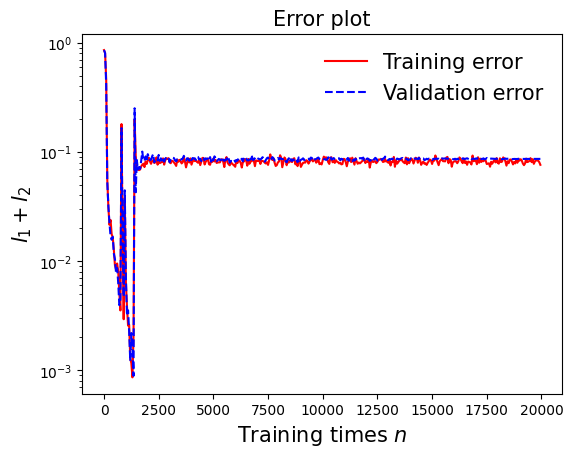

In [93]:
draw_loss(model4)

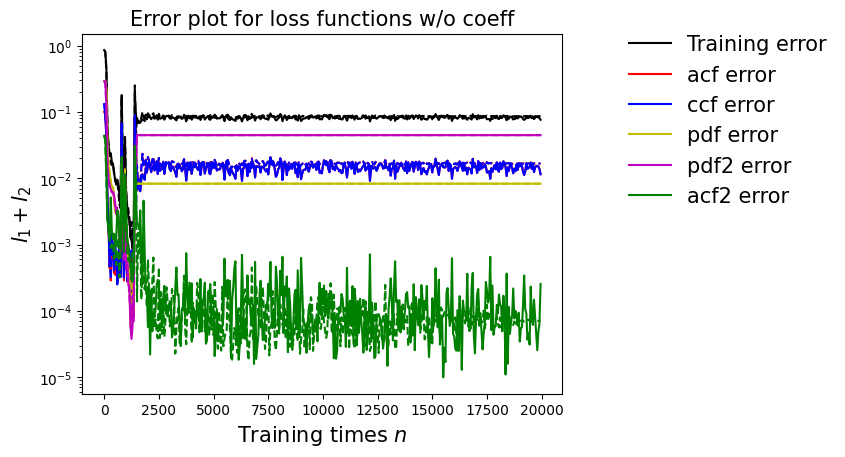

In [94]:
draw_errors(model4)

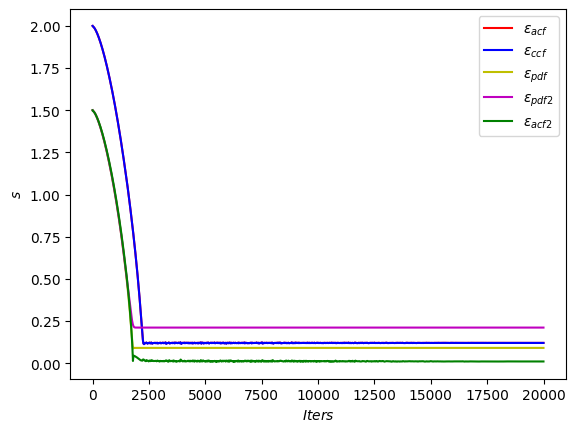

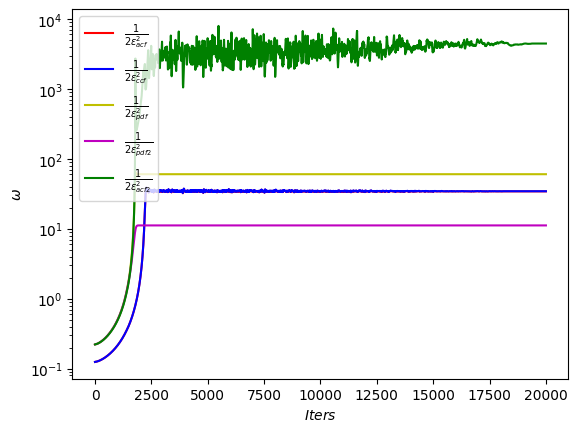

In [95]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

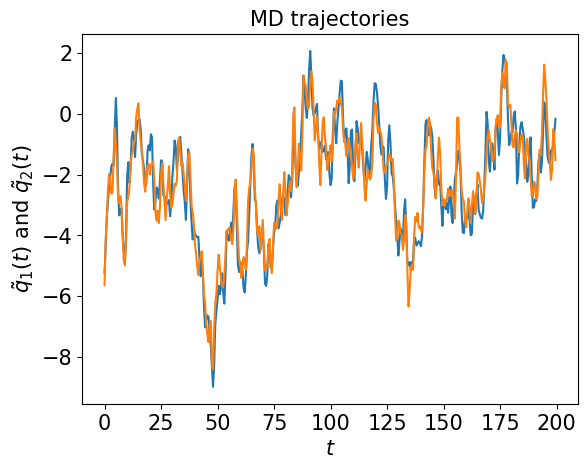

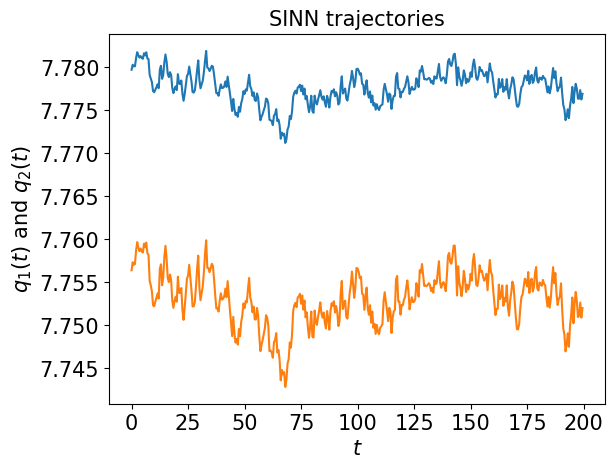

In [96]:
test1(model4)

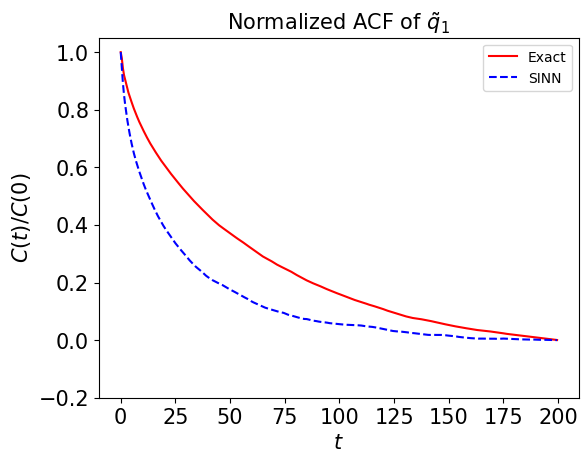

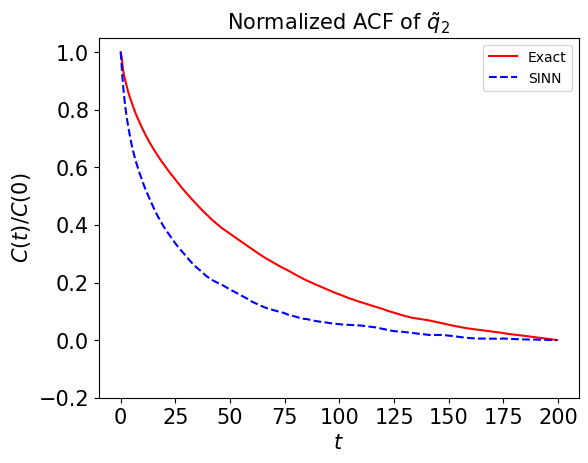

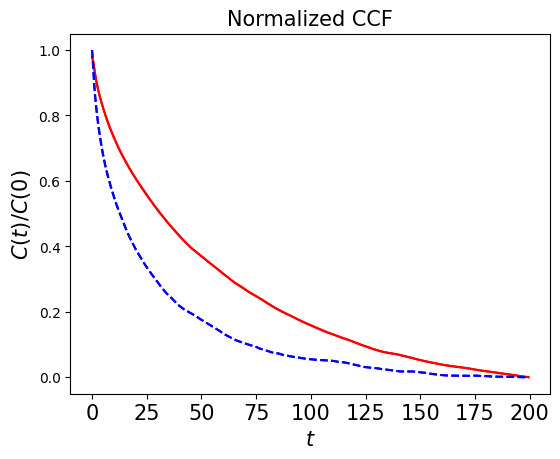

In [97]:
test2(model4)

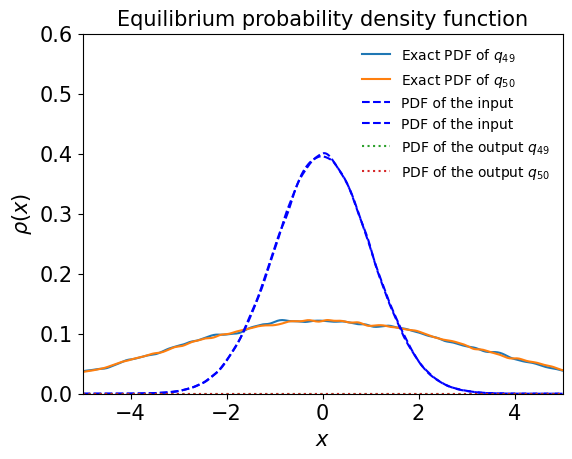

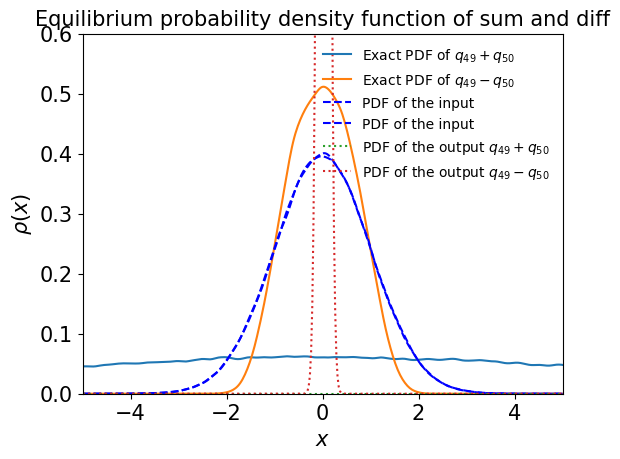

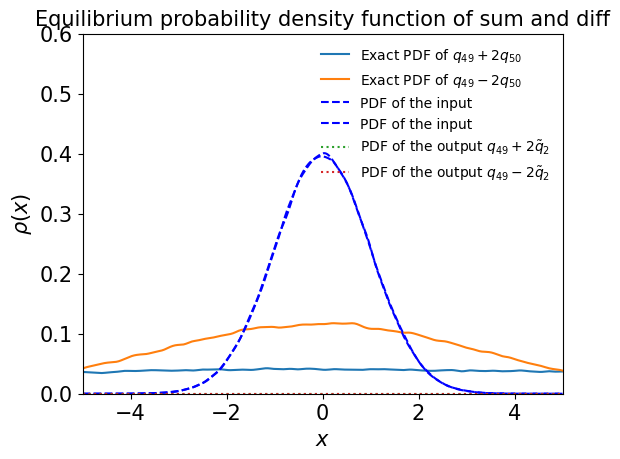

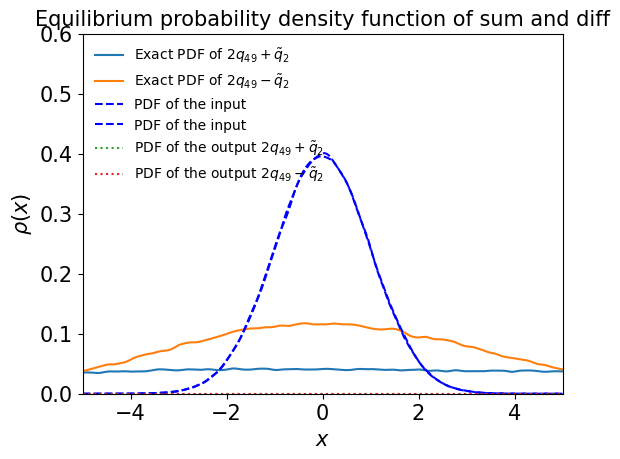

In [98]:
test3(model4)

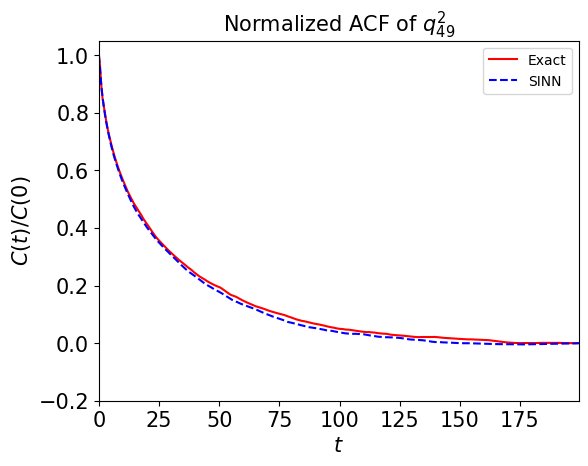

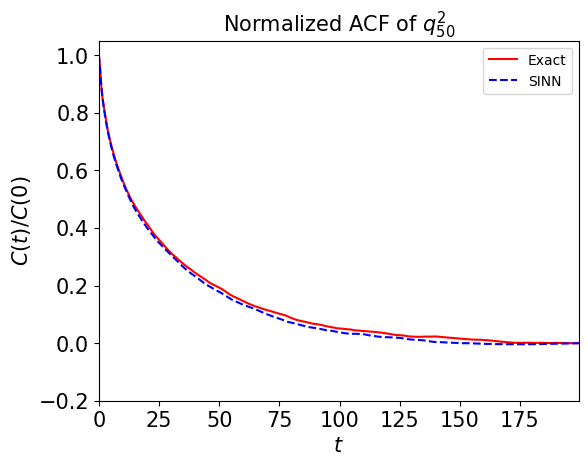

In [99]:
test4(model4)

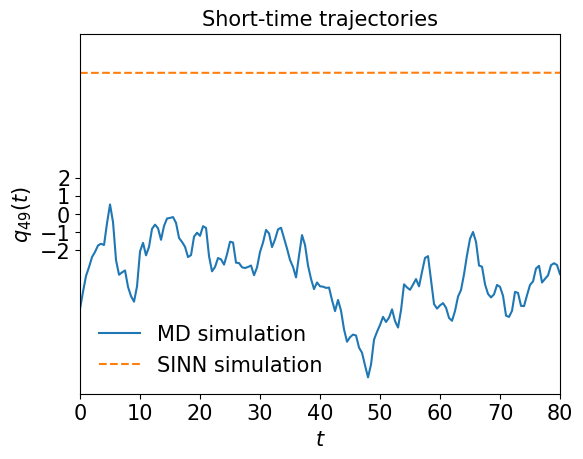

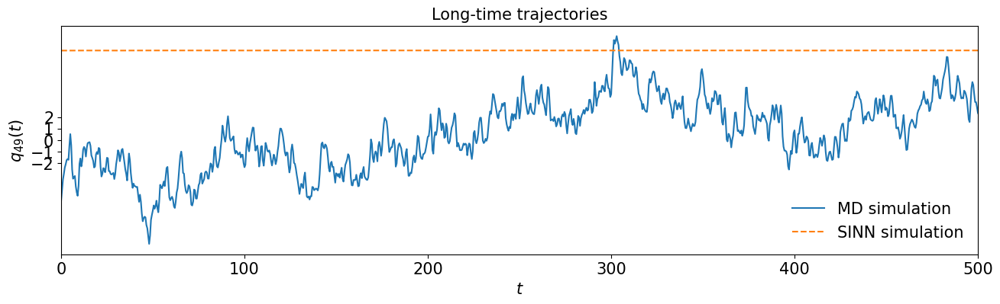

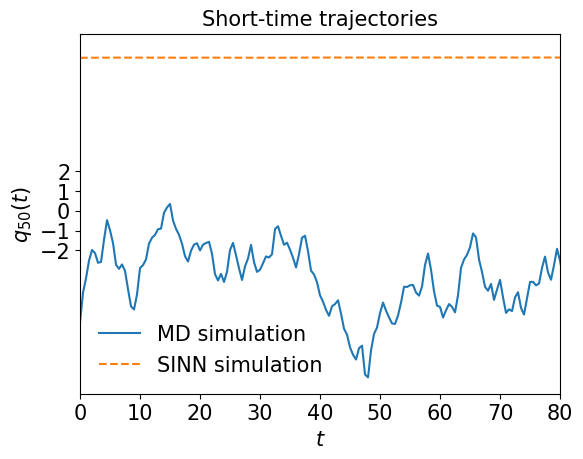

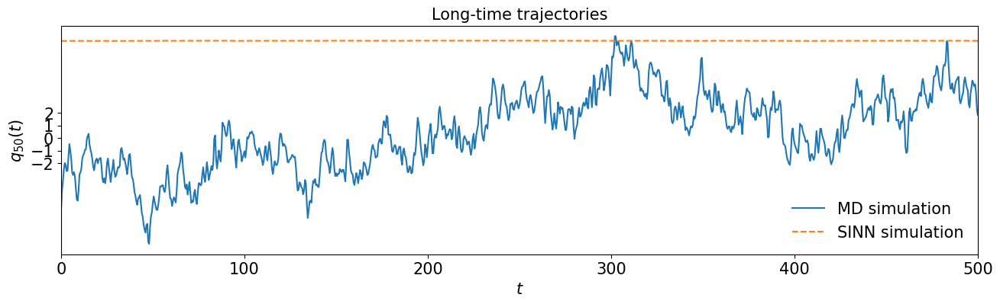

In [100]:
test5(model4)

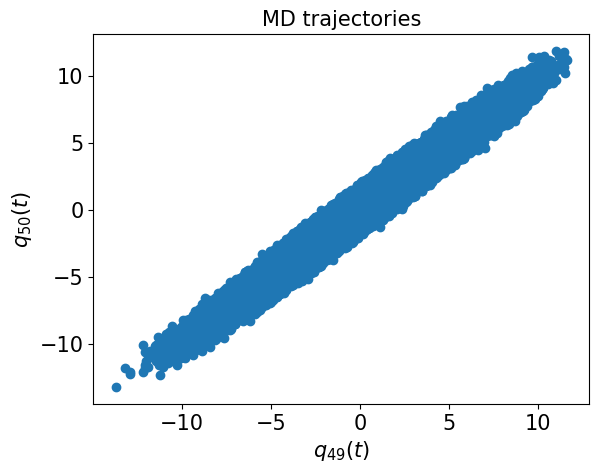

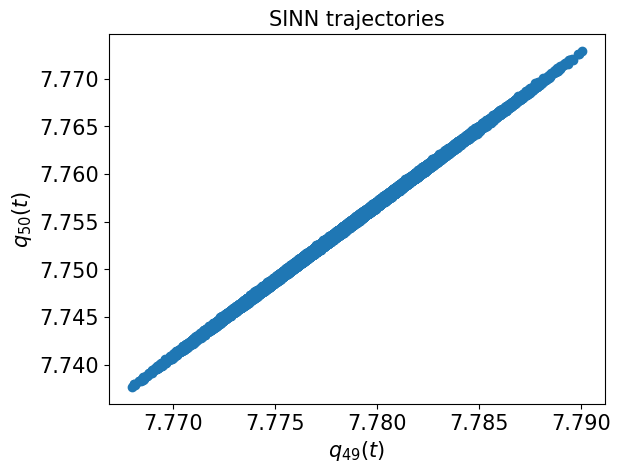

In [101]:
test6(model4)

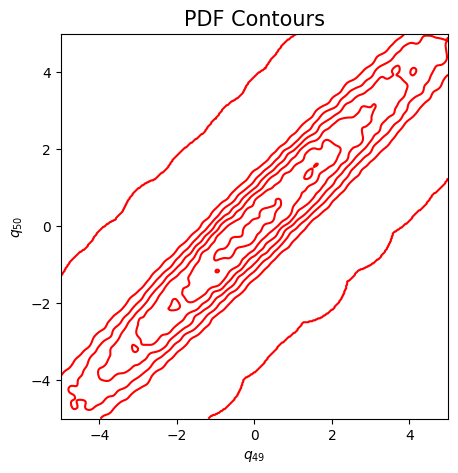

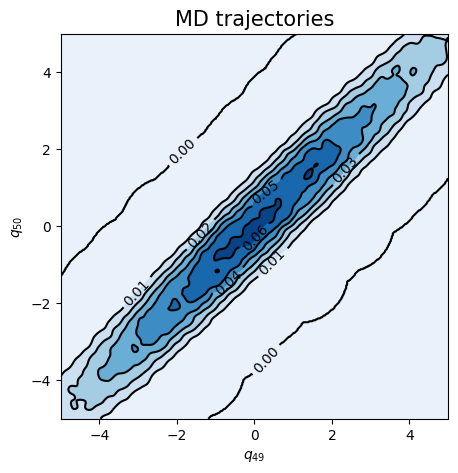

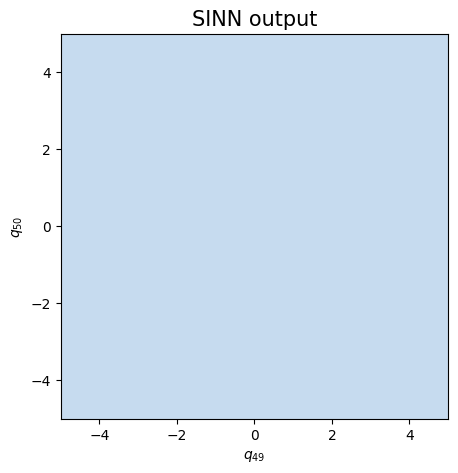

In [102]:
test7(model4)

In [103]:
### Defining SINN model
net5 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8326, 0.8331, acf: 0.10193, ccf: 0.10290, pdf: 0.29311, pdf2: 0.29008, acf2: 0.04511
[50]-th step loss: 0.7980, 0.7952, acf: 0.08873, ccf: 0.08853, pdf: 0.29311, pdf2: 0.29005, acf2: 0.03479
[100]-th step loss: 0.7100, 0.7040, acf: 0.05495, ccf: 0.05483, pdf: 0.29235, pdf2: 0.28701, acf2: 0.01482
[150]-th step loss: 0.1078, 0.0856, acf: 0.01207, ccf: 0.01206, pdf: 0.03484, pdf2: 0.02363, acf2: 0.00300
[200]-th step loss: 0.0332, 0.0303, acf: 0.00372, ccf: 0.00363, pdf: 0.01061, pdf2: 0.00975, acf2: 0.00256
[250]-th step loss: 0.0225, 0.0224, acf: 0.00345, ccf: 0.00327, pdf: 0.00628, pdf2: 0.00671, acf2: 0.00268
[300]-th step loss: 0.0246, 0.0202, acf: 0.00313, ccf: 0.00295, pdf: 0.00525, pdf2: 0.00552, acf2: 0.00333
[350]-th step loss: 0.0132, 0.0186, acf: 0.00332, ccf: 0.00327, pdf: 0.00431, pdf2: 0.00340, acf2: 0.00433
[400]-th step loss: 0.0098, 0.0094, acf: 0.00168, ccf: 0.00171, pdf: 0.00159, pdf2: 0.00170, acf2: 0.00275
[450]-th step loss: 0.0072, 0.0107, acf:

[3850]-th step loss: 0.0823, 0.0887, acf: 0.01774, ccf: 0.01766, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00020
[3900]-th step loss: 0.0816, 0.0857, acf: 0.01632, ccf: 0.01624, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00011
[3950]-th step loss: 0.0883, 0.0844, acf: 0.01566, ccf: 0.01558, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00010
[4000]-th step loss: 0.0895, 0.0826, acf: 0.01477, ccf: 0.01470, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00005
[4050]-th step loss: 0.0795, 0.0820, acf: 0.01450, ccf: 0.01443, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00005
[4100]-th step loss: 0.0864, 0.0835, acf: 0.01522, ccf: 0.01515, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00005
[4150]-th step loss: 0.0867, 0.0836, acf: 0.01529, ccf: 0.01521, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00006
[4200]-th step loss: 0.0739, 0.0808, acf: 0.01389, ccf: 0.01382, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00006
[4250]-th step loss: 0.0814, 0.0823, acf: 0.01465, ccf: 0.01458, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00004
[4300]-th step loss: 0.0802,

[7650]-th step loss: 0.0687, 0.0688, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01562
[7700]-th step loss: 0.0668, 0.0684, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01528
[7750]-th step loss: 0.0702, 0.0676, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01444
[7800]-th step loss: 0.0646, 0.0647, acf: 0.00035, ccf: 0.00034, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01092
[7850]-th step loss: 0.0661, 0.0669, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01372
[7900]-th step loss: 0.0670, 0.0668, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01362
[7950]-th step loss: 0.0681, 0.0689, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01576
[8000]-th step loss: 0.0683, 0.0677, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01452
[8050]-th step loss: 0.0670, 0.0660, acf: 0.00034, ccf: 0.00033, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01227
[8100]-th step loss: 0.0710,

[11450]-th step loss: 0.0694, 0.0695, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01633
[11500]-th step loss: 0.0633, 0.0688, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01565
[11550]-th step loss: 0.0657, 0.0684, acf: 0.00002, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01533
[11600]-th step loss: 0.0685, 0.0701, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01681
[11650]-th step loss: 0.0685, 0.0714, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01801
[11700]-th step loss: 0.0662, 0.0691, acf: 0.00007, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01595
[11750]-th step loss: 0.0674, 0.0708, acf: 0.00014, ccf: 0.00015, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01746
[11800]-th step loss: 0.0696, 0.0696, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01643
[11850]-th step loss: 0.0640, 0.0682, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01508
[11900]-th step los

[15250]-th step loss: 0.0675, 0.0704, acf: 0.00010, ccf: 0.00011, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01714
[15300]-th step loss: 0.0692, 0.0704, acf: 0.00011, ccf: 0.00012, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01712
[15350]-th step loss: 0.0668, 0.0701, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01692
[15400]-th step loss: 0.0641, 0.0682, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01509
[15450]-th step loss: 0.0681, 0.0688, acf: 0.00003, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01571
[15500]-th step loss: 0.0666, 0.0686, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01550
[15550]-th step loss: 0.0642, 0.0686, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01553
[15600]-th step loss: 0.0671, 0.0690, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01587
[15650]-th step loss: 0.0691, 0.0694, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01628
[15700]-th step los

[19050]-th step loss: 0.0661, 0.0690, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01589
[19100]-th step loss: 0.0659, 0.0691, acf: 0.00004, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01601
[19150]-th step loss: 0.0689, 0.0693, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01618
[19200]-th step loss: 0.0689, 0.0693, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01616
[19250]-th step loss: 0.0688, 0.0694, acf: 0.00005, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01622
[19300]-th step loss: 0.0662, 0.0694, acf: 0.00005, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01623
[19350]-th step loss: 0.0659, 0.0694, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01627
[19400]-th step loss: 0.0683, 0.0694, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01626
[19450]-th step loss: 0.0683, 0.0695, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01632
[19500]-th step los

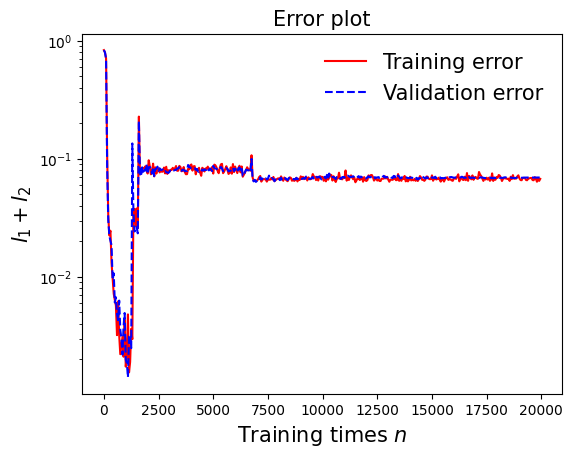

In [104]:
draw_loss(model5)

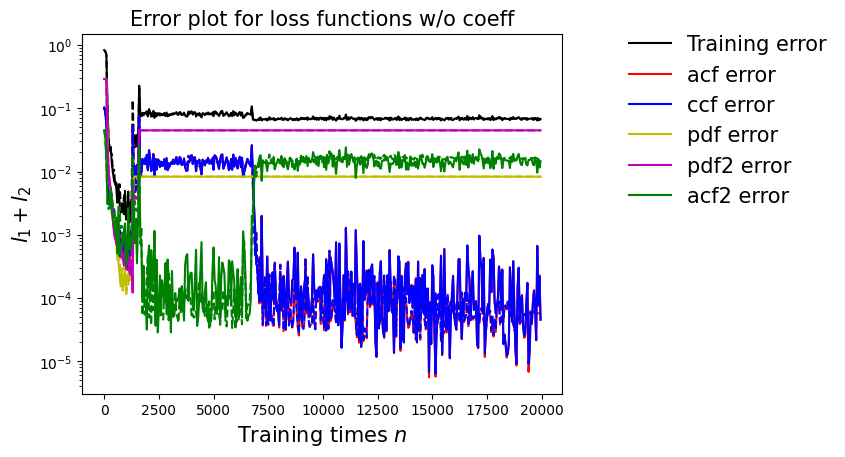

In [105]:
draw_errors(model5)

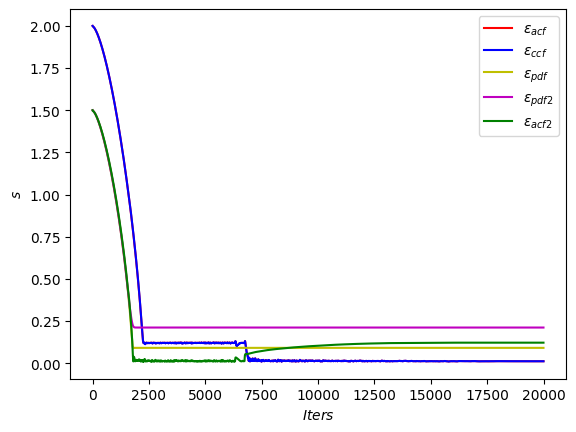

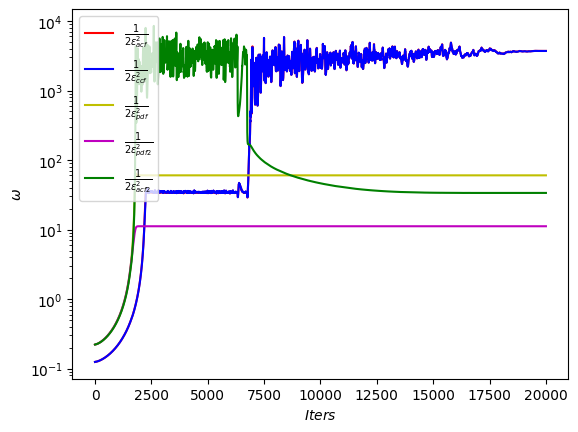

In [106]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

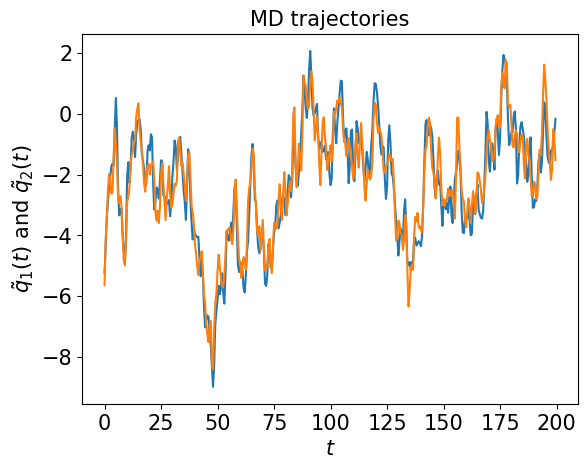

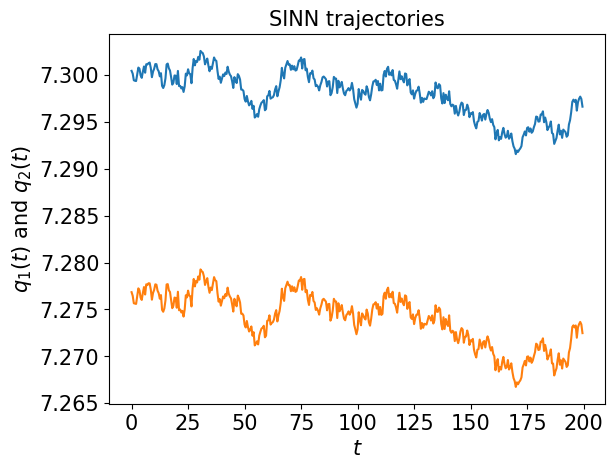

In [107]:
test1(model5)

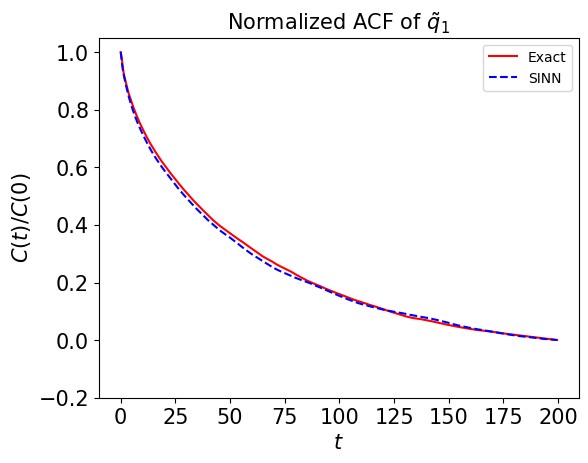

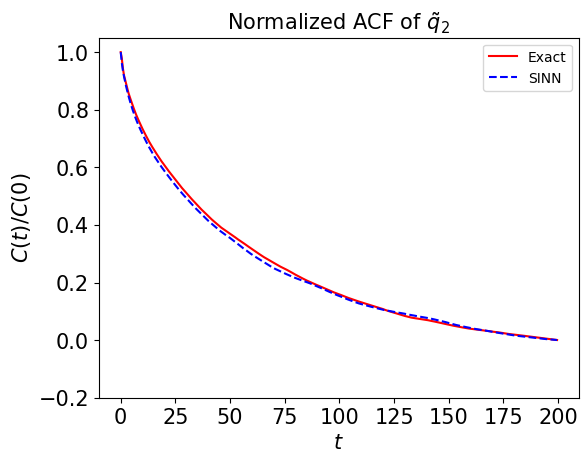

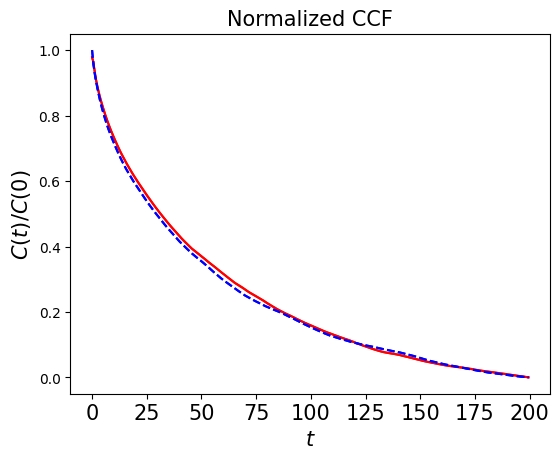

In [108]:
test2(model5)

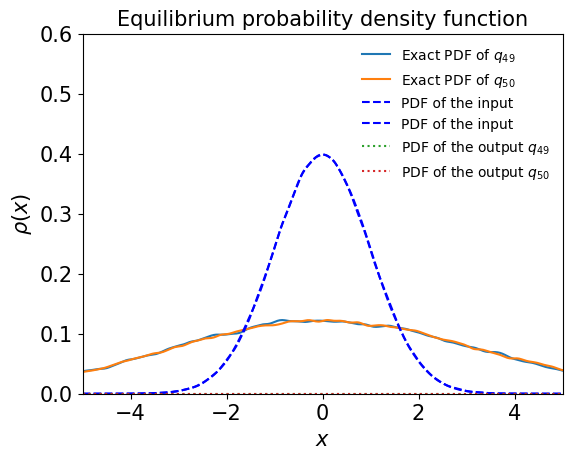

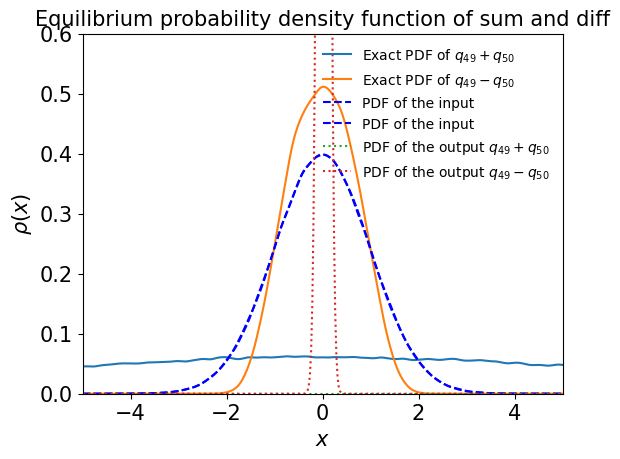

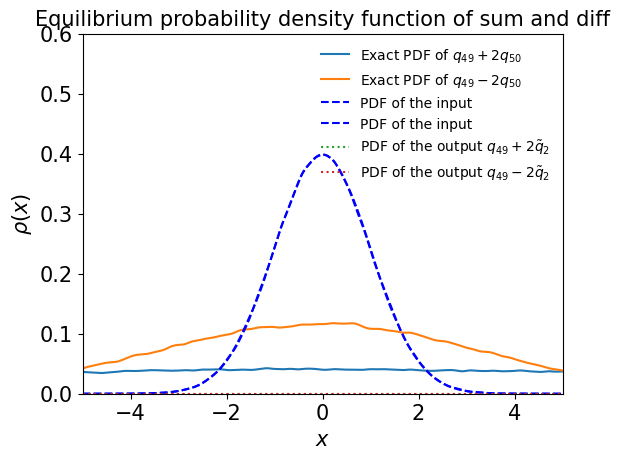

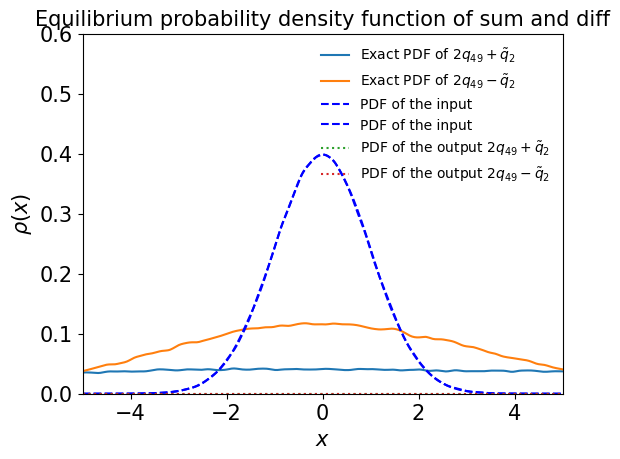

In [109]:
test3(model5)

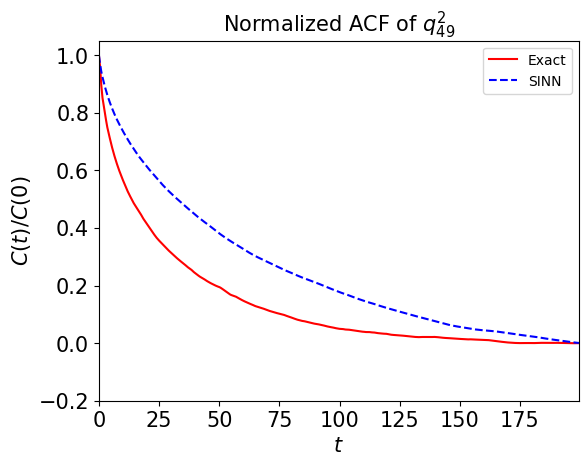

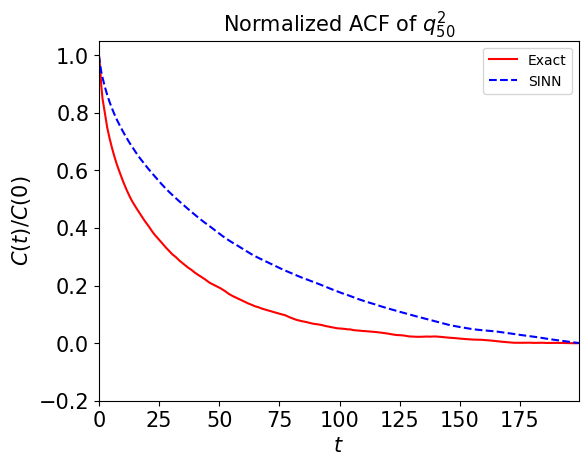

In [110]:
test4(model5)

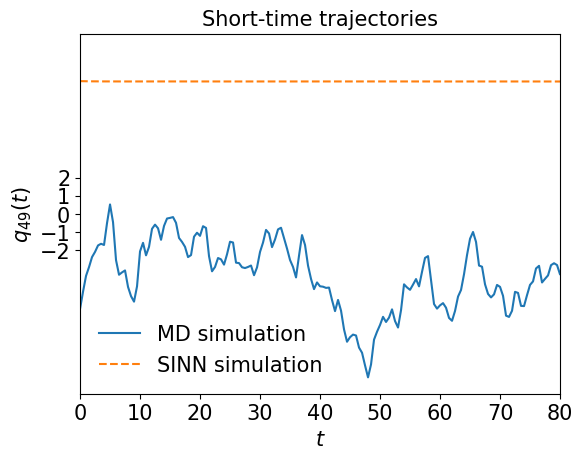

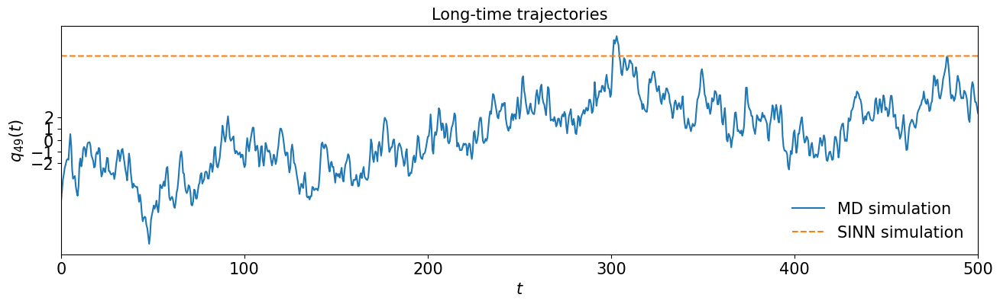

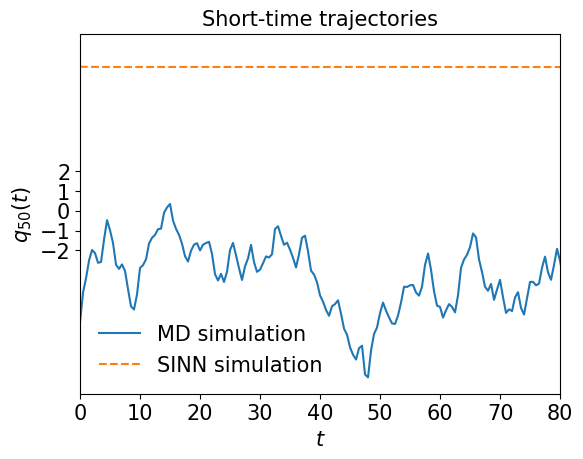

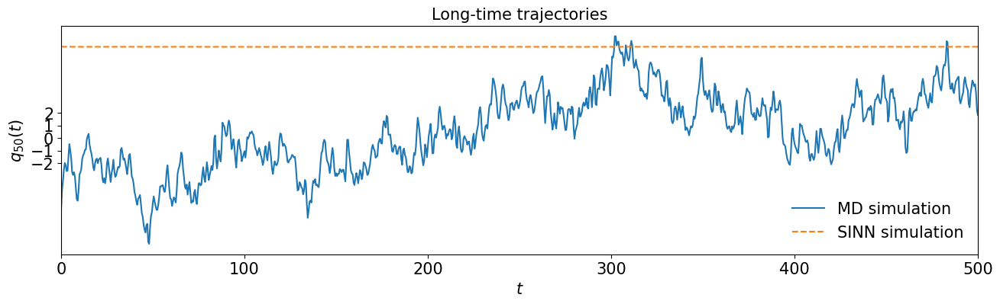

In [111]:
test5(model5)

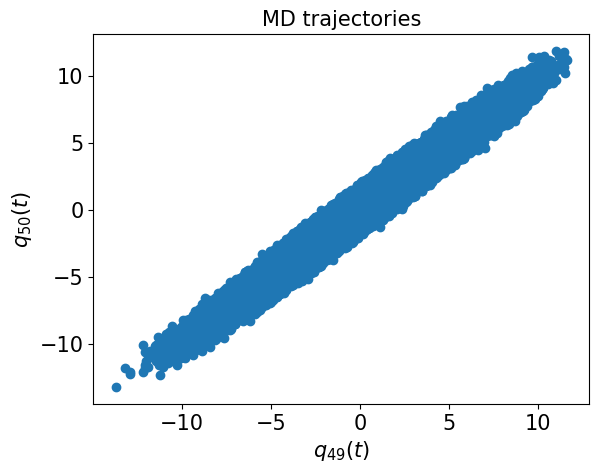

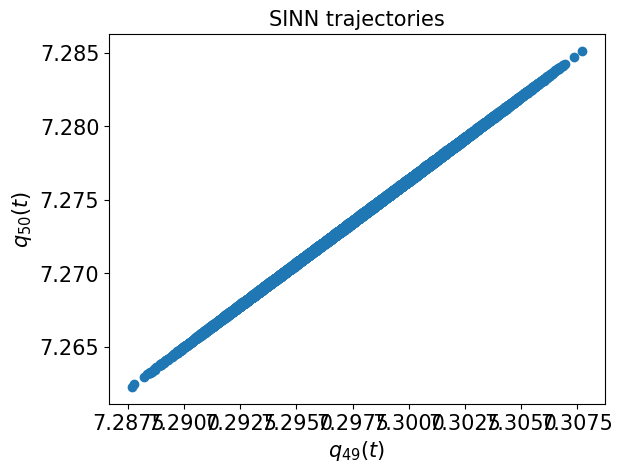

In [112]:
test6(model5)

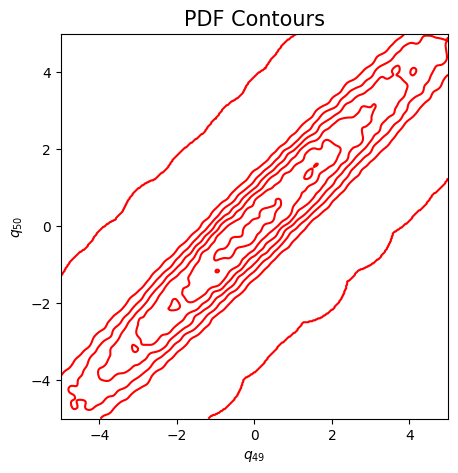

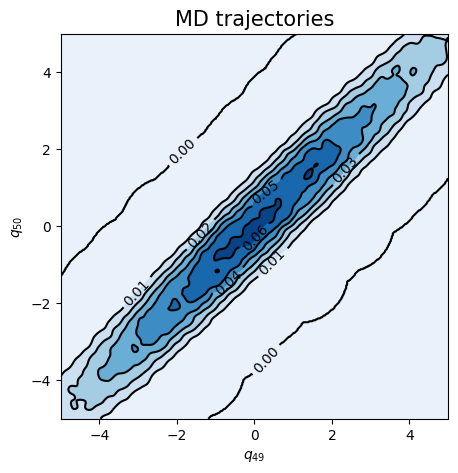

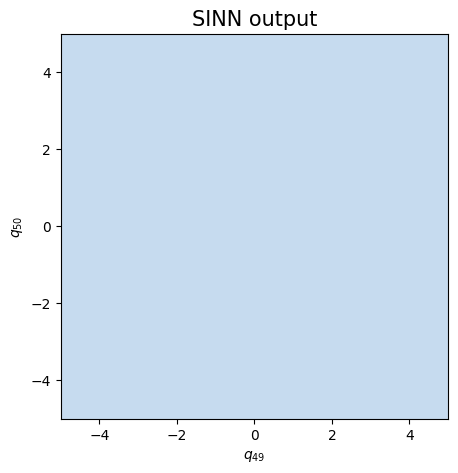

In [113]:
test7(model5)

In [114]:
### Defining SINN model
net6 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8285, 0.8289, acf: 0.09887, ccf: 0.10420, pdf: 0.29311, pdf2: 0.29023, acf2: 0.04245
[50]-th step loss: 0.7955, 0.7937, acf: 0.08820, ccf: 0.08785, pdf: 0.29312, pdf2: 0.29017, acf2: 0.03433
[100]-th step loss: 0.7186, 0.7123, acf: 0.05771, ccf: 0.05758, pdf: 0.29277, pdf2: 0.28861, acf2: 0.01564
[150]-th step loss: 0.0821, 0.0721, acf: 0.00539, ccf: 0.00539, pdf: 0.03015, pdf2: 0.02843, acf2: 0.00274
[200]-th step loss: 0.0472, 0.0497, acf: 0.00108, ccf: 0.00108, pdf: 0.02252, pdf2: 0.02212, acf2: 0.00292
[250]-th step loss: 0.0343, 0.0258, acf: 0.00184, ccf: 0.00186, pdf: 0.01037, pdf2: 0.00901, acf2: 0.00267
[300]-th step loss: 0.0173, 0.0162, acf: 0.00138, ccf: 0.00140, pdf: 0.00546, pdf2: 0.00533, acf2: 0.00264
[350]-th step loss: 0.0121, 0.0133, acf: 0.00150, ccf: 0.00152, pdf: 0.00386, pdf2: 0.00386, acf2: 0.00252
[400]-th step loss: 0.0147, 0.0153, acf: 0.00211, ccf: 0.00211, pdf: 0.00433, pdf2: 0.00428, acf2: 0.00248
[450]-th step loss: 0.0137, 0.0130, acf:

[3850]-th step loss: 0.0677, 0.0741, acf: 0.01032, ccf: 0.01026, pdf: 0.00829, pdf2: 0.04473, acf2: 0.00049
[3900]-th step loss: 0.0799, 0.0744, acf: 0.01048, ccf: 0.01042, pdf: 0.00829, pdf2: 0.04472, acf2: 0.00046
[3950]-th step loss: 0.0757, 0.0764, acf: 0.01160, ccf: 0.01154, pdf: 0.00829, pdf2: 0.04472, acf2: 0.00026
[4000]-th step loss: 0.0802, 0.0827, acf: 0.01486, ccf: 0.01479, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00004
[4050]-th step loss: 0.0826, 0.0771, acf: 0.01199, ccf: 0.01193, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00020
[4100]-th step loss: 0.0811, 0.0795, acf: 0.01324, ccf: 0.01317, pdf: 0.00829, pdf2: 0.04469, acf2: 0.00009
[4150]-th step loss: 0.0791, 0.0789, acf: 0.01295, ccf: 0.01288, pdf: 0.00829, pdf2: 0.04468, acf2: 0.00012
[4200]-th step loss: 0.0819, 0.0786, acf: 0.01280, ccf: 0.01273, pdf: 0.00829, pdf2: 0.04469, acf2: 0.00012
[4250]-th step loss: 0.0854, 0.0769, acf: 0.01191, ccf: 0.01184, pdf: 0.00829, pdf2: 0.04467, acf2: 0.00021
[4300]-th step loss: 0.0846,

[7650]-th step loss: 0.0488, 0.0381, acf: 0.01295, ccf: 0.01289, pdf: 0.00827, pdf2: 0.00386, acf2: 0.00009
[7700]-th step loss: 0.0486, 0.0400, acf: 0.01402, ccf: 0.01396, pdf: 0.00828, pdf2: 0.00365, acf2: 0.00005
[7750]-th step loss: 0.0423, 0.0401, acf: 0.01412, ccf: 0.01405, pdf: 0.00828, pdf2: 0.00364, acf2: 0.00005
[7800]-th step loss: 0.0445, 0.0426, acf: 0.01508, ccf: 0.01501, pdf: 0.00829, pdf2: 0.00404, acf2: 0.00018
[7850]-th step loss: 0.0459, 0.0416, acf: 0.01488, ccf: 0.01481, pdf: 0.00827, pdf2: 0.00366, acf2: 0.00003
[7900]-th step loss: 0.0381, 0.0350, acf: 0.01144, ccf: 0.01138, pdf: 0.00828, pdf2: 0.00363, acf2: 0.00027
[7950]-th step loss: 0.0445, 0.0378, acf: 0.01292, ccf: 0.01286, pdf: 0.00828, pdf2: 0.00366, acf2: 0.00010
[8000]-th step loss: 0.0365, 0.0378, acf: 0.01286, ccf: 0.01280, pdf: 0.00828, pdf2: 0.00373, acf2: 0.00010
[8050]-th step loss: 0.0403, 0.0361, acf: 0.01206, ccf: 0.01200, pdf: 0.00828, pdf2: 0.00362, acf2: 0.00018
[8100]-th step loss: 0.0306,

[11450]-th step loss: 0.0454, 0.0390, acf: 0.01357, ccf: 0.01350, pdf: 0.00825, pdf2: 0.00364, acf2: 0.00007
[11500]-th step loss: 0.0401, 0.0387, acf: 0.01335, ccf: 0.01328, pdf: 0.00826, pdf2: 0.00374, acf2: 0.00007
[11550]-th step loss: 0.0407, 0.0388, acf: 0.01346, ccf: 0.01339, pdf: 0.00824, pdf2: 0.00361, acf2: 0.00007
[11600]-th step loss: 0.0370, 0.0372, acf: 0.01258, ccf: 0.01252, pdf: 0.00825, pdf2: 0.00370, acf2: 0.00013
[11650]-th step loss: 0.0390, 0.0356, acf: 0.01179, ccf: 0.01173, pdf: 0.00824, pdf2: 0.00362, acf2: 0.00022
[11700]-th step loss: 0.0394, 0.0396, acf: 0.01385, ccf: 0.01378, pdf: 0.00824, pdf2: 0.00365, acf2: 0.00005
[11750]-th step loss: 0.0447, 0.0369, acf: 0.01249, ccf: 0.01243, pdf: 0.00825, pdf2: 0.00362, acf2: 0.00014
[11800]-th step loss: 0.0391, 0.0383, acf: 0.01317, ccf: 0.01311, pdf: 0.00825, pdf2: 0.00364, acf2: 0.00008
[11850]-th step loss: 0.0403, 0.0392, acf: 0.01370, ccf: 0.01363, pdf: 0.00824, pdf2: 0.00361, acf2: 0.00006
[11900]-th step los

[15250]-th step loss: 0.0424, 0.0395, acf: 0.01385, ccf: 0.01379, pdf: 0.00822, pdf2: 0.00362, acf2: 0.00004
[15300]-th step loss: 0.0363, 0.0386, acf: 0.01337, ccf: 0.01331, pdf: 0.00823, pdf2: 0.00365, acf2: 0.00007
[15350]-th step loss: 0.0385, 0.0391, acf: 0.01360, ccf: 0.01354, pdf: 0.00822, pdf2: 0.00368, acf2: 0.00006
[15400]-th step loss: 0.0429, 0.0410, acf: 0.01448, ccf: 0.01441, pdf: 0.00822, pdf2: 0.00387, acf2: 0.00003
[15450]-th step loss: 0.0397, 0.0400, acf: 0.01408, ccf: 0.01402, pdf: 0.00822, pdf2: 0.00361, acf2: 0.00004
[15500]-th step loss: 0.0405, 0.0386, acf: 0.01337, ccf: 0.01332, pdf: 0.00822, pdf2: 0.00363, acf2: 0.00007
[15550]-th step loss: 0.0400, 0.0391, acf: 0.01365, ccf: 0.01359, pdf: 0.00822, pdf2: 0.00362, acf2: 0.00006
[15600]-th step loss: 0.0492, 0.0387, acf: 0.01342, ccf: 0.01336, pdf: 0.00821, pdf2: 0.00366, acf2: 0.00006
[15650]-th step loss: 0.0419, 0.0390, acf: 0.01361, ccf: 0.01354, pdf: 0.00823, pdf2: 0.00361, acf2: 0.00006
[15700]-th step los

[19050]-th step loss: 0.0362, 0.0388, acf: 0.01351, ccf: 0.01347, pdf: 0.00820, pdf2: 0.00360, acf2: 0.00006
[19100]-th step loss: 0.0395, 0.0389, acf: 0.01356, ccf: 0.01352, pdf: 0.00820, pdf2: 0.00359, acf2: 0.00006
[19150]-th step loss: 0.0395, 0.0391, acf: 0.01365, ccf: 0.01361, pdf: 0.00820, pdf2: 0.00359, acf2: 0.00005
[19200]-th step loss: 0.0431, 0.0390, acf: 0.01362, ccf: 0.01358, pdf: 0.00820, pdf2: 0.00359, acf2: 0.00005
[19250]-th step loss: 0.0431, 0.0389, acf: 0.01355, ccf: 0.01351, pdf: 0.00819, pdf2: 0.00359, acf2: 0.00006
[19300]-th step loss: 0.0444, 0.0390, acf: 0.01361, ccf: 0.01357, pdf: 0.00820, pdf2: 0.00359, acf2: 0.00005
[19350]-th step loss: 0.0456, 0.0390, acf: 0.01358, ccf: 0.01354, pdf: 0.00819, pdf2: 0.00359, acf2: 0.00006
[19400]-th step loss: 0.0357, 0.0389, acf: 0.01357, ccf: 0.01353, pdf: 0.00820, pdf2: 0.00360, acf2: 0.00006
[19450]-th step loss: 0.0385, 0.0389, acf: 0.01354, ccf: 0.01351, pdf: 0.00819, pdf2: 0.00359, acf2: 0.00006
[19500]-th step los

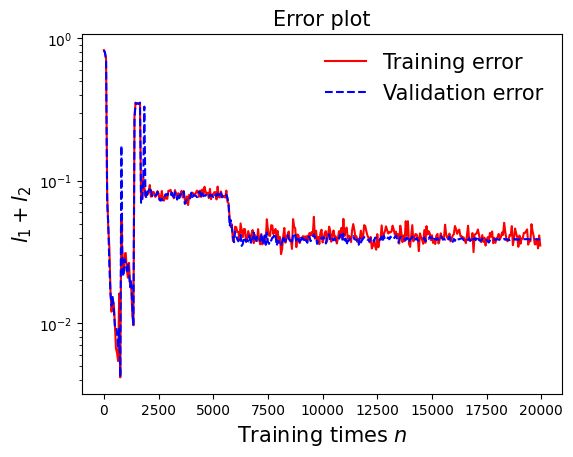

In [115]:
draw_loss(model6)

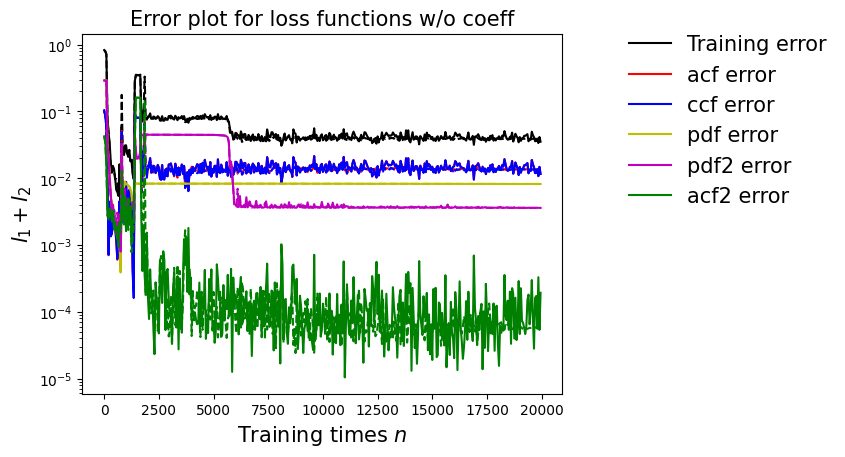

In [116]:
draw_errors(model6)

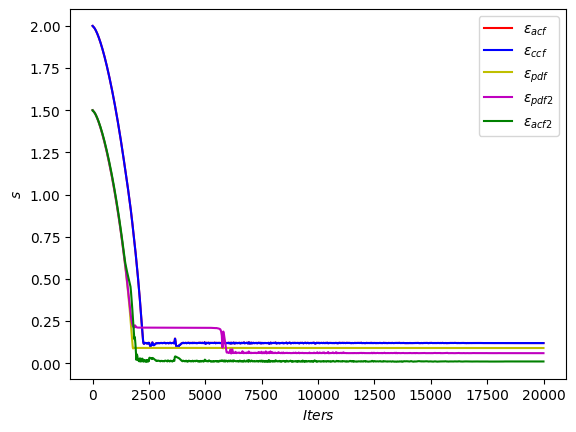

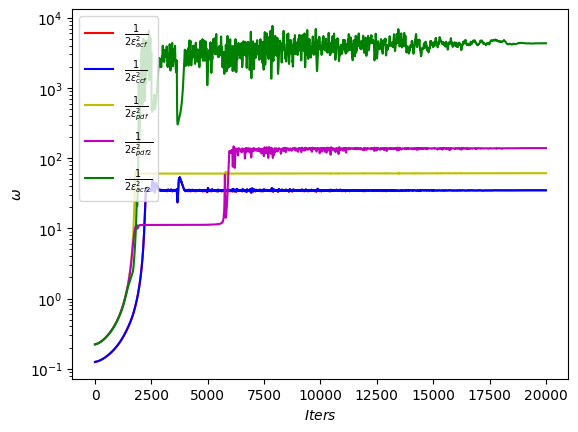

In [117]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

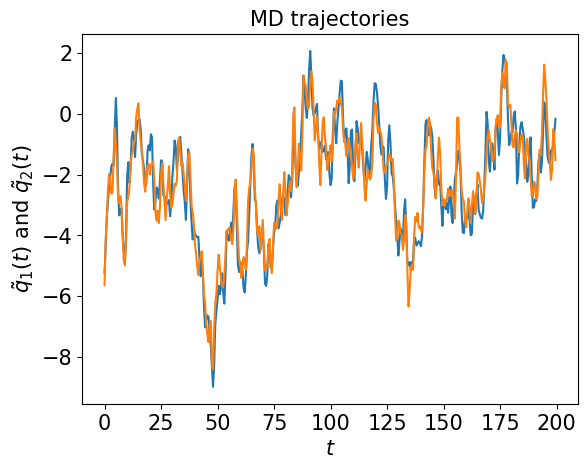

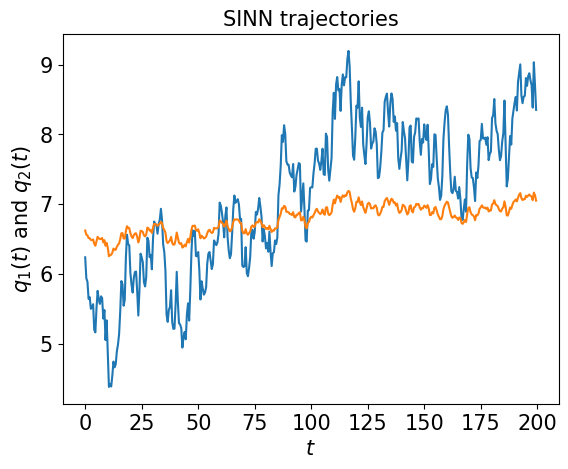

In [118]:
test1(model6)

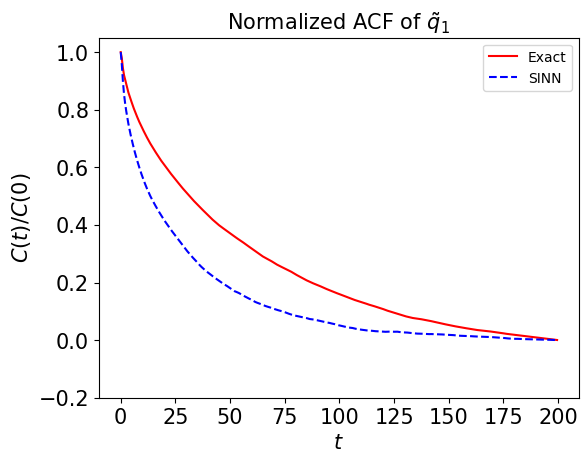

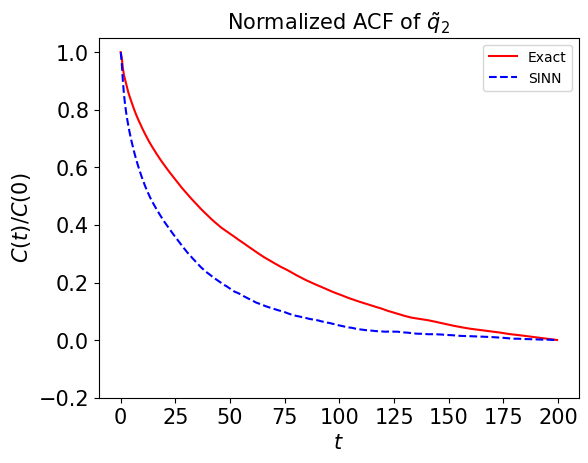

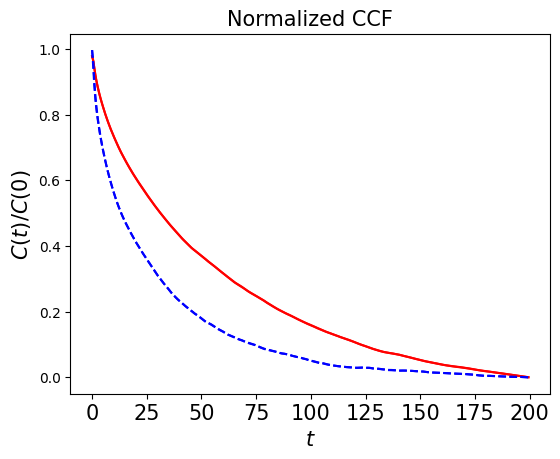

In [119]:
test2(model6)

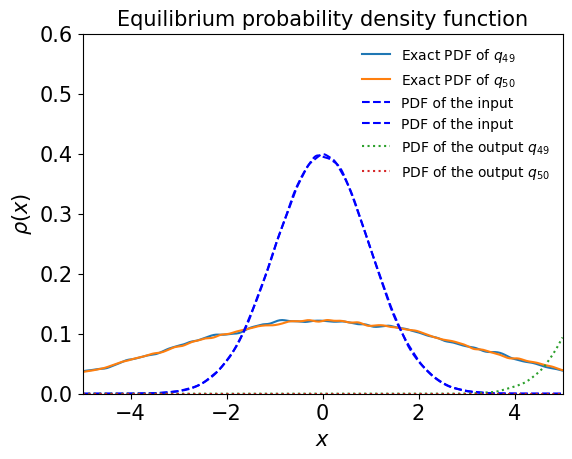

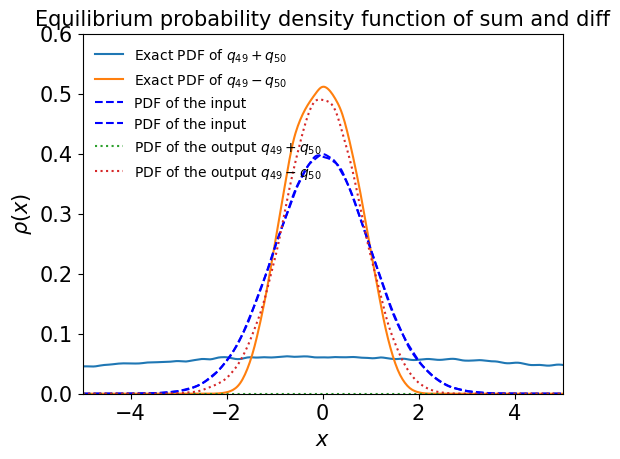

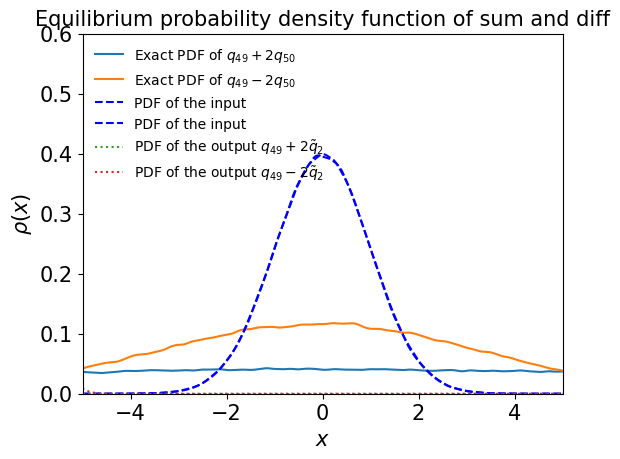

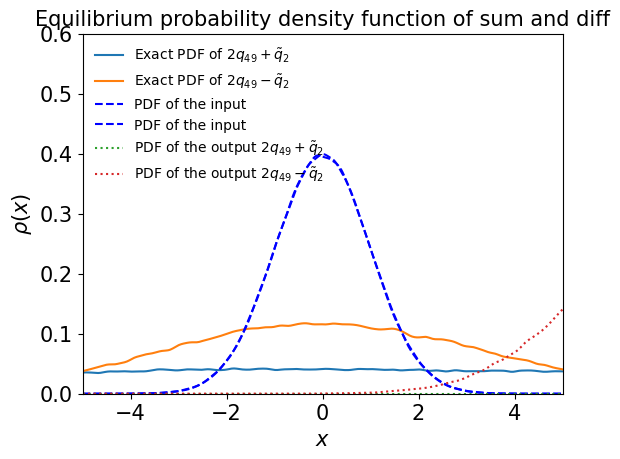

In [120]:
test3(model6)

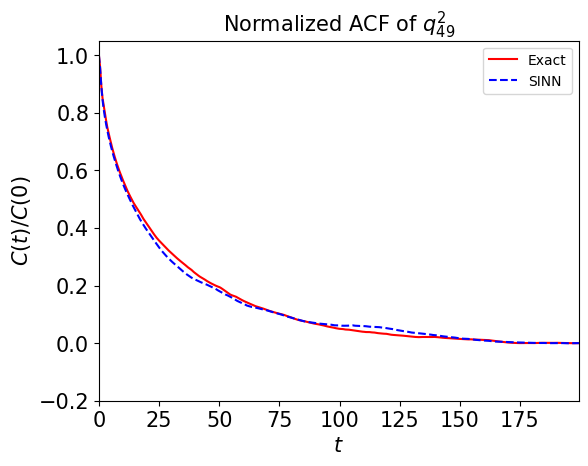

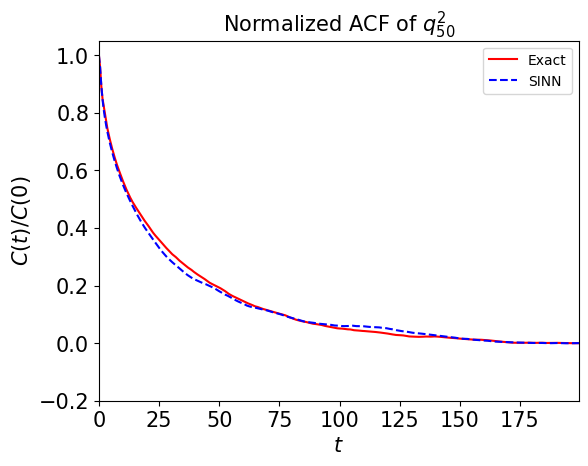

In [121]:
test4(model6)

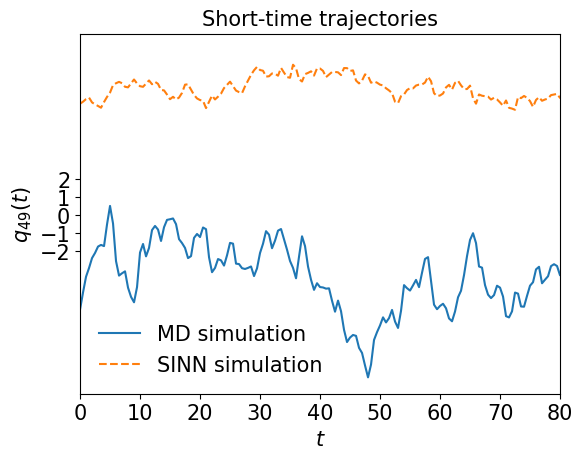

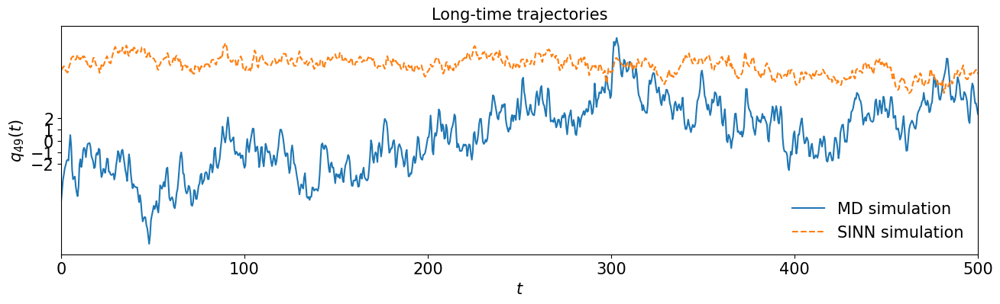

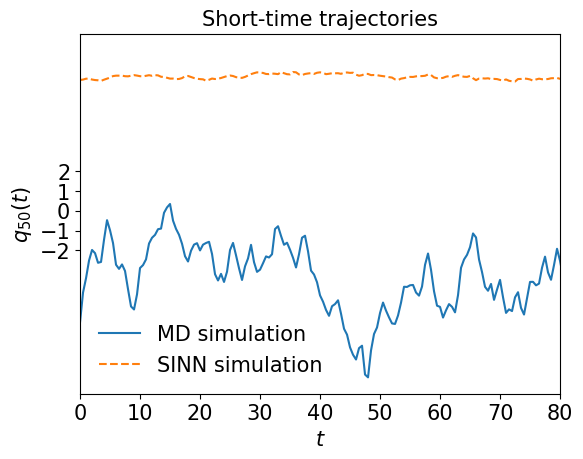

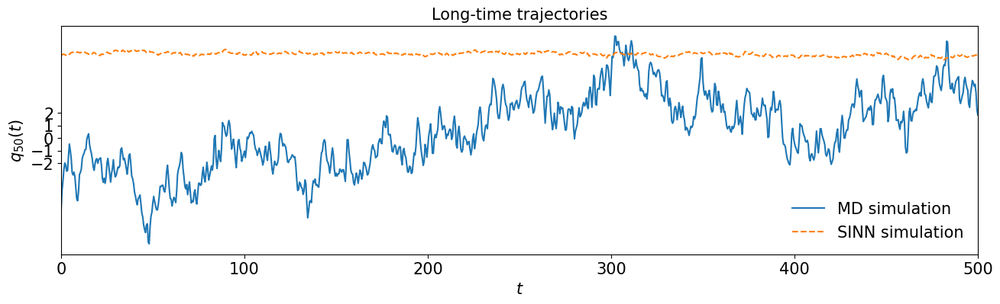

In [122]:
test5(model6)

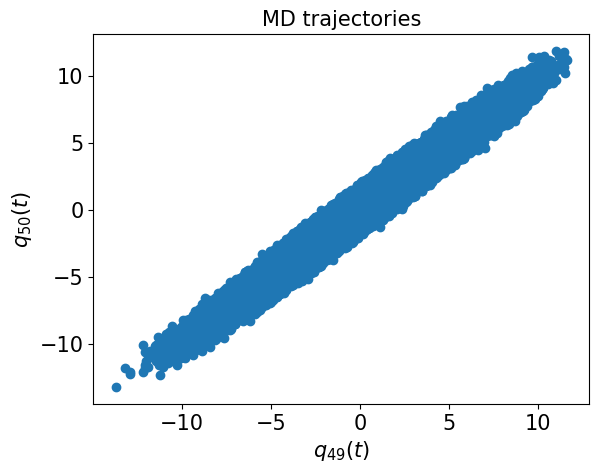

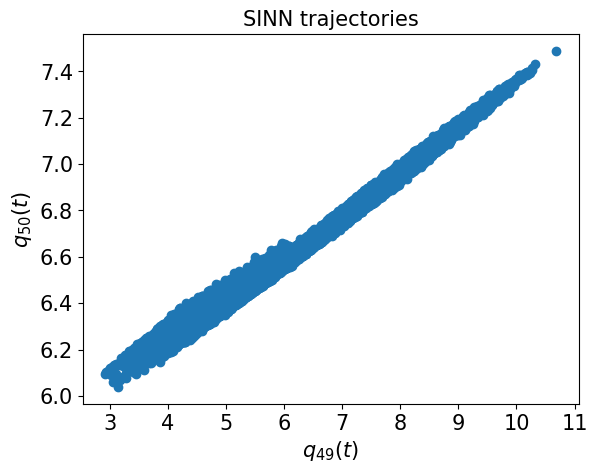

In [123]:
test6(model6)

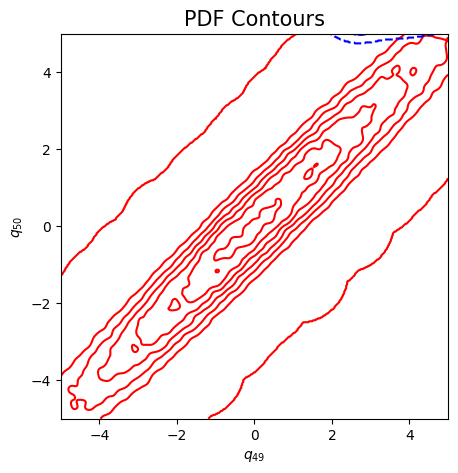

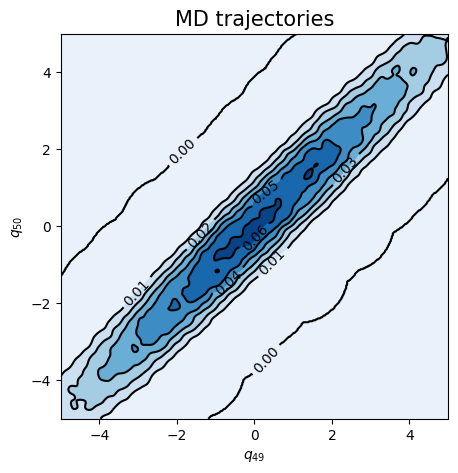

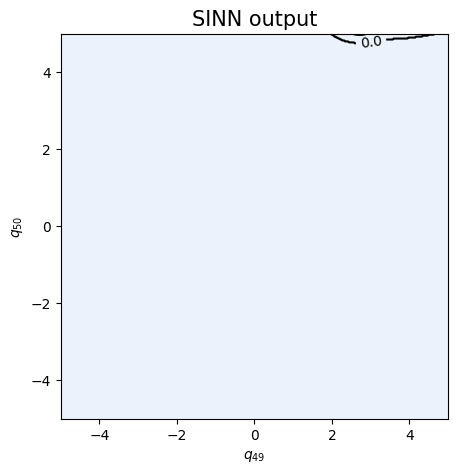

In [124]:
test7(model6)

In [125]:
### Defining SINN model
net7 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8333, 0.8349, acf: 0.10051, ccf: 0.10746, pdf: 0.29314, pdf2: 0.29004, acf2: 0.04375
[50]-th step loss: 0.7982, 0.7997, acf: 0.09048, ccf: 0.09017, pdf: 0.29314, pdf2: 0.28998, acf2: 0.03592
[100]-th step loss: 0.7600, 0.7638, acf: 0.07704, ccf: 0.07687, pdf: 0.29313, pdf2: 0.28993, acf2: 0.02687
[150]-th step loss: 0.1792, 0.1618, acf: 0.02422, ccf: 0.02418, pdf: 0.05749, pdf2: 0.05097, acf2: 0.00492
[200]-th step loss: 0.0698, 0.0594, acf: 0.00503, ccf: 0.00503, pdf: 0.01813, pdf2: 0.01773, acf2: 0.01350
[250]-th step loss: 0.0589, 0.0522, acf: 0.00954, ccf: 0.00953, pdf: 0.01403, pdf2: 0.01330, acf2: 0.00585
[300]-th step loss: 0.0370, 0.0371, acf: 0.00393, ccf: 0.00394, pdf: 0.01279, pdf2: 0.01151, acf2: 0.00490
[350]-th step loss: 0.0291, 0.0279, acf: 0.00364, ccf: 0.00364, pdf: 0.00929, pdf2: 0.00838, acf2: 0.00299
[400]-th step loss: 0.0343, 0.0295, acf: 0.00079, ccf: 0.00080, pdf: 0.01341, pdf2: 0.01162, acf2: 0.00288
[450]-th step loss: 0.0246, 0.0188, acf:

KeyboardInterrupt: 

In [ ]:
draw_loss(model7)

In [ ]:
draw_errors(model7)

In [ ]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

In [ ]:
test1(model7)

In [ ]:
test2(model7)

In [ ]:
test3(model7)

In [ ]:
test4(model7)

In [ ]:
test5(model7)

In [ ]:
test6(model7)

In [ ]:
test7(model7)

In [ ]:
### Defining SINN model
net8 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

In [ ]:
draw_loss(model8)

In [ ]:
draw_errors(model8)

In [ ]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

In [ ]:
test1(model8)

In [ ]:
test2(model8)

In [ ]:
test3(model8)

In [ ]:
test4(model8)

In [ ]:
test5(model8)

In [ ]:
test6(model8)

In [ ]:
test7(model8)

In [ ]:
### Defining SINN model
net9 = SINN(2, 100, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

In [ ]:
draw_loss(model9)

In [ ]:
draw_errors(model9)

In [ ]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

In [ ]:
test1(model9)

In [ ]:
test2(model9)

In [ ]:
test3(model9)

In [ ]:
test4(model9)

In [ ]:
test5(model9)

In [ ]:
test6(model9)

In [ ]:
test7(model9)